In [164]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import statsmodels.api as sm
import statsmodels.tsa.stattools as st
import statsmodels.formula.api as smf
from statsmodels.tsa.arima_model import ARMA,ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa import stattools
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from pylab import *
#Feature Selection Metrics
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from ace_cream import ace_cream
from minepy import MINE
from minepy import cstats
import pingouin as pg
from rdc import rdc
from skfeature.function.information_theoretical_based import JMI,CMIM,MRMR,MIFS,MIM,CIFE
from hyppo.independence import Hsic,CCA
from hyppo.d_variate import dHsic

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor


import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1

In [2]:
%%time
power = pd.read_csv(".\dataset\household_power_consumption.txt\household_power_consumption.txt",
                    header = 0,
                    sep = ";",
                    parse_dates={'date_time' : ['Date', 'Time']}, infer_datetime_format=True, 
                    low_memory=False, na_values=['nan','?'], index_col='date_time'
                   )

Wall time: 19.9 s


In [3]:
power.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float64
 1   Global_reactive_power  float64
 2   Voltage                float64
 3   Global_intensity       float64
 4   Sub_metering_1         float64
 5   Sub_metering_2         float64
 6   Sub_metering_3         float64
dtypes: float64(7)
memory usage: 126.7 MB


In [4]:
power_copy = power.copy()

In [3]:
power.isna().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

In [4]:
for j in range(0,7):
    power.iloc[:,j]=power.iloc[:,j].fillna(power.iloc[:,j].mean())

In [5]:
power.isna().sum()

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

In [8]:
power.index.date

array([datetime.date(2006, 12, 16), datetime.date(2006, 12, 16),
       datetime.date(2006, 12, 16), ..., datetime.date(2010, 11, 26),
       datetime.date(2010, 11, 26), datetime.date(2010, 11, 26)],
      dtype=object)

In [113]:
data = power.resample('D').sum()

In [114]:
data

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,,
2006-12-16,1209.176,34.922,93552.53,5180.8,0.0,546.0,4926.0
2006-12-17,3390.460,226.006,345725.32,14398.6,2033.0,4187.0,13341.0
2006-12-18,2203.826,161.792,347373.64,9247.2,1063.0,2621.0,14018.0
2006-12-19,1666.194,150.942,348479.01,7094.0,839.0,7602.0,6197.0
2006-12-20,2225.748,160.998,348923.61,9313.0,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536,142.354,345883.85,8660.4,4855.0,2110.0,10136.0
2010-11-23,1577.536,137.450,346428.76,6731.2,1871.0,458.0,7611.0
2010-11-24,1796.248,132.460,345644.59,7559.4,1096.0,2848.0,12224.0


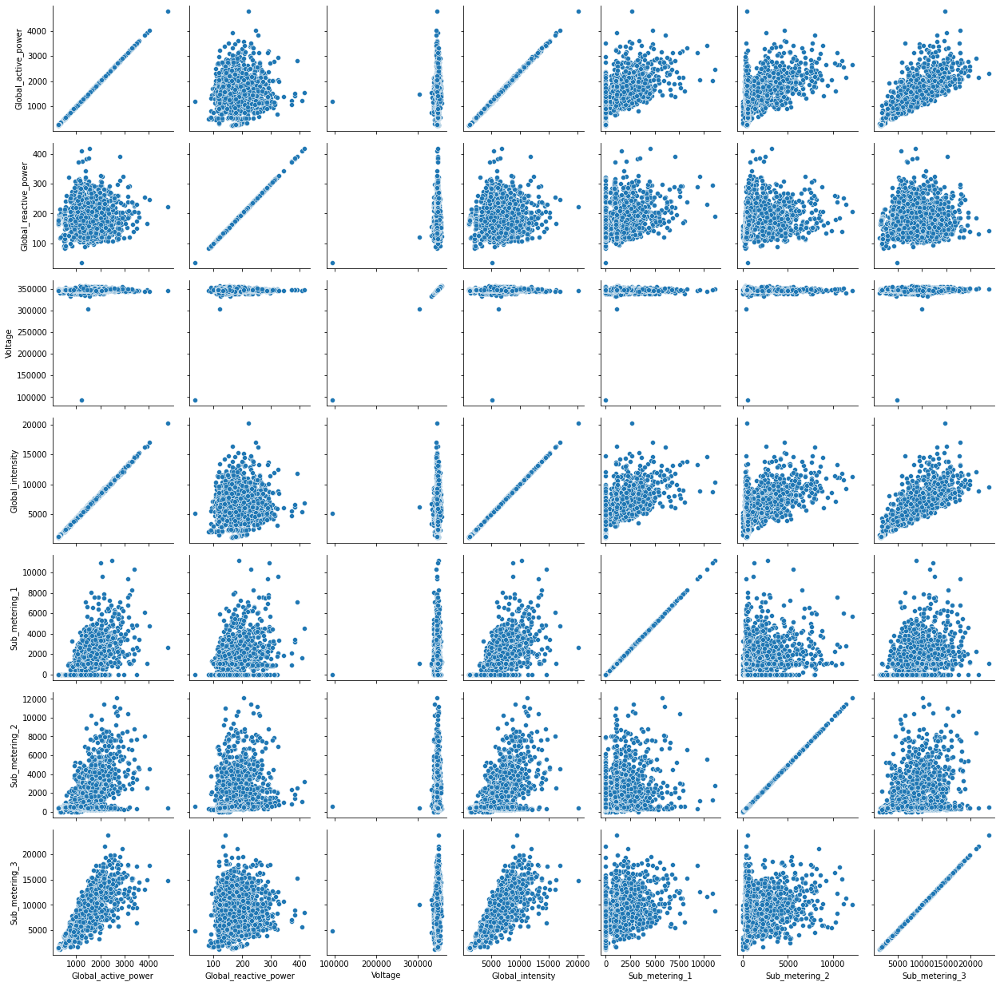

In [7]:
g = sns.PairGrid(data)
g.map(sns.scatterplot)
g.savefig("scatter_electricity.png")

In [48]:
for j in range(data.shape[1]):
    for i in range(data.shape[0]):
        if data.iloc[i,j] == 0.0:
            data.iloc[i,j]=data.iloc[:,j].mean()

In [183]:
data

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,,
2006-12-16,1209.176,34.922,93552.53,5180.8,0.0,546.0,4926.0
2006-12-17,3390.460,226.006,345725.32,14398.6,2033.0,4187.0,13341.0
2006-12-18,2203.826,161.792,347373.64,9247.2,1063.0,2621.0,14018.0
2006-12-19,1666.194,150.942,348479.01,7094.0,839.0,7602.0,6197.0
2006-12-20,2225.748,160.998,348923.61,9313.0,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536,142.354,345883.85,8660.4,4855.0,2110.0,10136.0
2010-11-23,1577.536,137.450,346428.76,6731.2,1871.0,458.0,7611.0
2010-11-24,1796.248,132.460,345644.59,7559.4,1096.0,2848.0,12224.0


In [566]:
pearson_xy = [stats.pearsonr(x_train_L.iloc[:,i],y_train_L)[0] for i in range(x_train_L.shape[1])]

In [1]:
fig,ax = plt.subplots(7,1,figsize=(20,50))
for i in range(x_train_no.shape[1]):
    ax[i].set_title(x_train_no.columns[i])
    autocorrelation_plot(x_train_no.iloc[:,i],ax = ax[i])

NameError: name 'plt' is not defined

## Without any preprocessing

In [8]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

## Train Split Data

In [9]:
def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [10]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

In [115]:
df = data.copy()
df['Global_active_power_1'] = df['Global_active_power'].shift(-1)
df.dropna(inplace=True)

df_no = data.copy()
df_no['Global_active_power_1'] = data['Global_active_power'].shift(-1)
df_no.dropna(inplace=True)

In [116]:
train_df,test_df = Split_Part(df_no,0.7)

## No lagging
x_train_no,y_train_no = segment(train_df,'Global_active_power_1')
x_test_no,y_test_no = segment(test_df,'Global_active_power_1')

lag_df = lag_data(df,30,'Global_active_power_1')
train_lag,test_lag = Split_Part(lag_df,0.7)
## Lagging
x_train_L,y_train_L = segment(train_lag,'Global_active_power_1')
x_test_L,y_test_L = segment(test_lag,'Global_active_power_1')

In [117]:
total_corr = 0.0
for i in range(train_df.shape[1]):
    for j in range(i+1,train_df.shape[1]):
           total_corr+=stats.pearsonr(train_df.iloc[:,i],train_df.iloc[:,j])[0]

In [118]:
total_corr/=train_df.shape[1]*(train_df.shape[1]-1)*0.5

In [119]:
total_corr

0.2891948698928569

Linear_r2:-1.143769
 Linear_rmse:446.182484
 Linear_mse:199078.808876
 RandomForestRegressor_r2:-2.755247
 RandomForestRegressor_rmse:439.713674
 RandomForestRegressor_mse:193348.115082


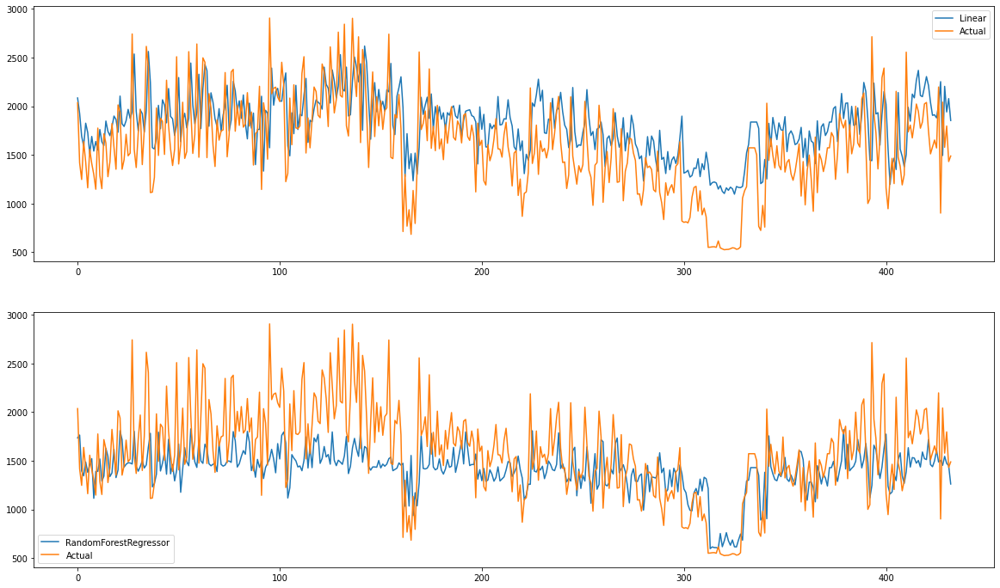

In [123]:
y_no,rmse_no = Stacking_Regressor(x_train_no,y_train_no,x_test_no,y_test_no)

Linear_r2:0.220687
 Linear_rmse:395.259193
 Linear_mse:156229.829306
 RandomForestRegressor_r2:-0.380328
 RandomForestRegressor_rmse:354.947725
 RandomForestRegressor_mse:125987.887236


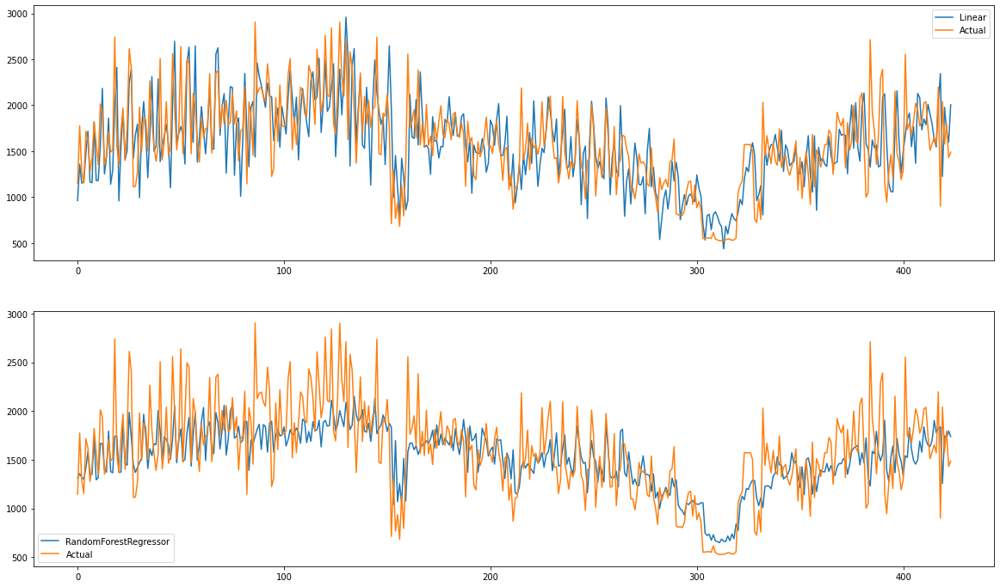

In [124]:
y_lall,rmse_lall = Stacking_Regressor(x_train_L,y_train_L,x_test_L,y_test_L)

## No Selection on Multiple Regression Model
### Lagging all features

### PACF

In [16]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
#     lags.remove(0)
    return lags

In [17]:
lags_pacf = {}
for col in data.columns:
    lags_pacf[col] = lag_based_PACF(x_train_no[col],29,0.05)

In [18]:
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))

In [591]:
len(cols)

79

Linear_r2:0.124454
 Linear_rmse:373.024492
 Linear_mse:139147.271994
 RandomForestRegressor_r2:-0.440186
 RandomForestRegressor_rmse:356.952717
 RandomForestRegressor_mse:127415.242284


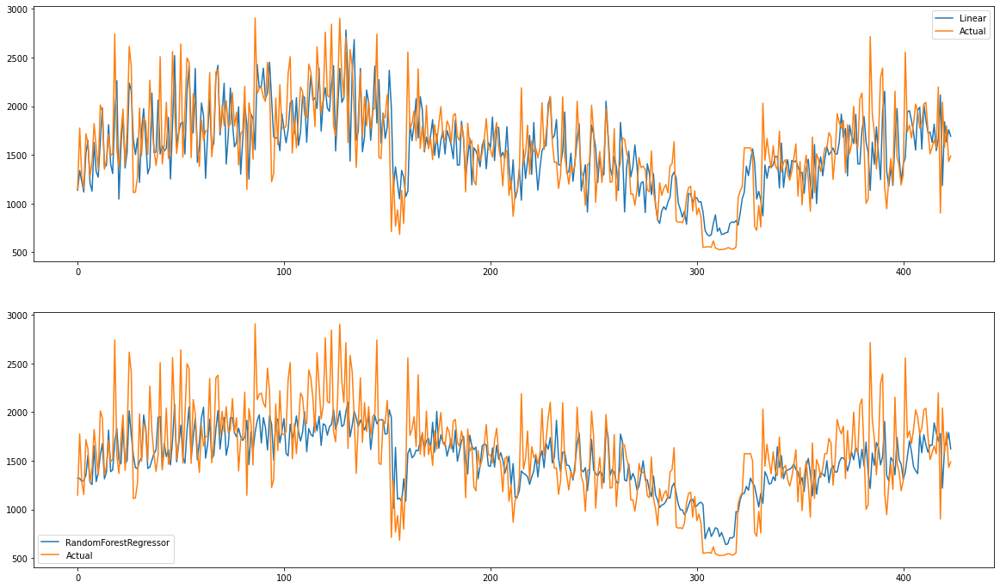

In [592]:
y_pacf,rmse_pacf = Stacking_Regressor(x_train_L[cols],y_train_L,x_test_L[cols],y_test_L)

In [175]:
def mRMR_same(selected,idx,metric_xy,metric_xx_1,metric_xx_2,alpha):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(X_s)
#         for i in range(col_len):
#             for j in range(col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)*(col_len-1)*0.5
#         for i in range(col_len):
#             for j in range(col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        metric_xx_1_score = sum([metric_xx_1[idx][i] for i in selected])/(col_len - 1)
        metric_xx_2_score = sum([metric_xx_2[idx][i] for i in selected])/(col_len - 1)
        mrmr = (relevance_score - alpha*metric_xx_1_score - (1.0-alpha)*metric_xx_2_score)

    return mrmr

In [176]:
def incremental_same(x,metric,alpha):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx_1 = []
    metric_xx_2 = []
    # stop = False
    if metric == 'MI-MI-CCF':
        metric_xy = mi_xy
        metric_xx_1 = mi_xx
        metric_xx_2 = ccf_xx
#     elif metric == 'MIC-MIC':
#         metric_xy = mic_xy
#         metric_xx = mic_xx
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR_same(selected,idx,metric_xy,metric_xx_1,metric_xx_2,alpha)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score

        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [178]:
alpha_range = np.arange(0,1,0.1)

In [179]:
alpha_range

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

In [180]:
features = {}
for i in alpha_range:
    features[i]=incremental_same(x_train_L,'MI-MI-CCF',i)

MI-MI-CCF
MI-MI-CCF[0, 160, 166, 161, 153, 3, 159, 157, 169, 1, 156, 155, 12, 158, 152, 6, 167, 154, 5, 95, 170, 135, 162, 81, 175, 7, 171, 99, 165, 168, 8, 93, 164, 94, 126, 173, 178, 4, 96, 52, 88, 163, 125, 19, 172, 174, 129, 181],delta_score:0.002376637706024587
MI-MI-CCF[0, 160, 166, 161, 153, 12, 169, 159, 3, 1, 155, 156, 158, 157, 152, 6, 167, 135, 5, 95, 154, 81, 170, 162, 7, 175, 171, 99, 165, 168, 8, 93, 126, 164, 94, 4, 52, 125, 19, 173, 178, 88, 96, 129, 174, 181, 172, 163, 36, 67],delta_score:0.00013841217439782005
MI-MI-CCF[0, 160, 166, 161, 153, 12, 169, 152, 155, 1, 3, 135, 158, 157, 159, 6, 156, 95, 5, 167, 81, 175, 7, 162, 170, 96, 171, 168, 19, 126, 154, 99, 93, 4, 165, 52, 8, 181, 164, 173, 125, 88, 178, 94, 129, 33],delta_score:0.00259813382039642
MI-MI-CCF[0, 160, 166, 12, 153, 169, 161, 94, 135, 155, 1, 158, 6, 159, 157, 3, 167, 152, 5, 95, 81, 156, 175, 96, 162, 170, 19, 126, 52, 154, 4, 171, 99, 125, 93, 181, 33, 168, 165, 8, 88, 164, 129, 7, 173, 64, 178, 123,

In [181]:
for k,v in features.items():
    print(k,len(v))

0.0 48
0.1 50
0.2 46
0.30000000000000004 51
0.4 52
0.5 58
0.6000000000000001 60
0.7000000000000001 62
0.8 71
0.9 82


0.0
Linear_r2:0.088507
 Linear_rmse:356.152922
 Linear_mse:126844.904102
 RandomForestRegressor_r2:-0.422915
 RandomForestRegressor_rmse:352.425260
 RandomForestRegressor_mse:124203.563757 elastic_r2:-0.065733
 elastic_rmse:353.358521
 elastic_mse:124862.244363
0.1
Linear_r2:0.090863
 Linear_rmse:357.234288
 Linear_mse:127616.336800
 RandomForestRegressor_r2:-0.584682
 RandomForestRegressor_rmse:353.313681
 RandomForestRegressor_mse:124830.557330 elastic_r2:-0.088501
 elastic_rmse:355.746479
 elastic_mse:126555.557342
0.2
Linear_r2:0.099959
 Linear_rmse:355.135869
 Linear_mse:126121.485494
 RandomForestRegressor_r2:-0.366638
 RandomForestRegressor_rmse:349.874941
 RandomForestRegressor_mse:122412.474121 elastic_r2:-0.048262
 elastic_rmse:351.101814
 elastic_mse:123272.483765
0.30000000000000004
Linear_r2:0.084415
 Linear_rmse:365.258983
 Linear_mse:133414.124746
 RandomForestRegressor_r2:-0.437424
 RandomForestRegressor_rmse:348.400424
 RandomForestRegressor_mse:121382.855565 elastic_r

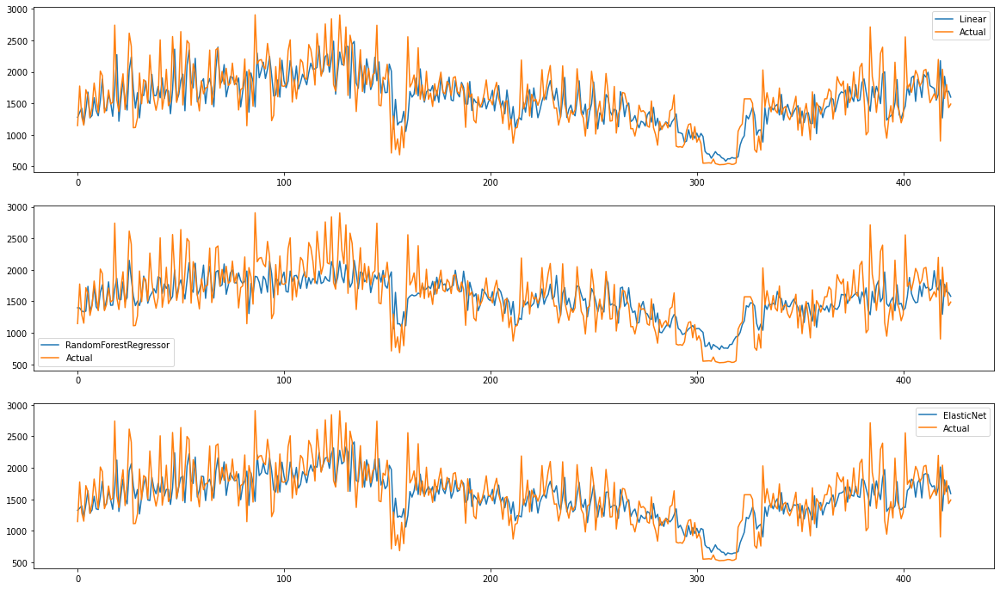

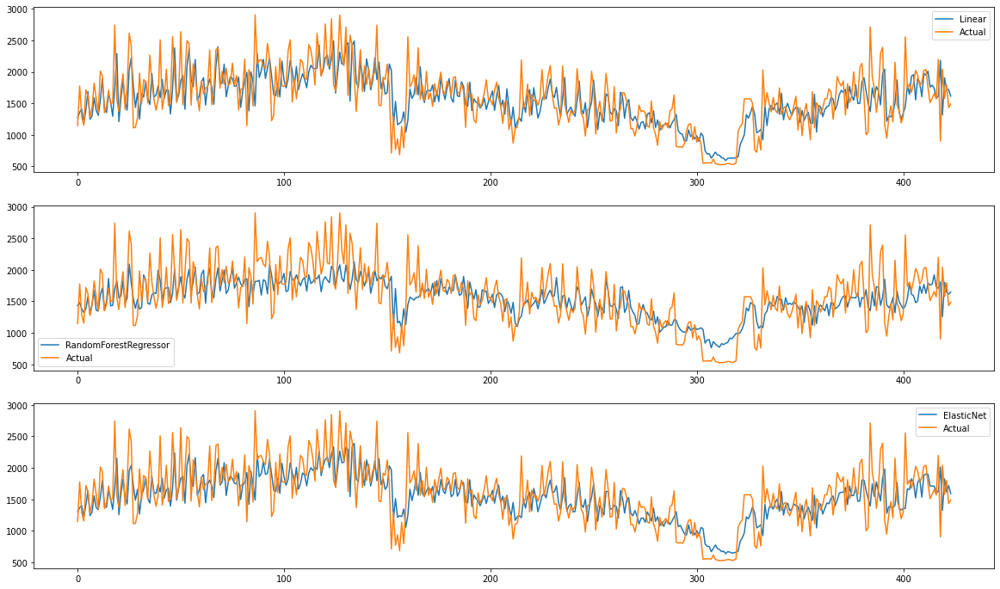

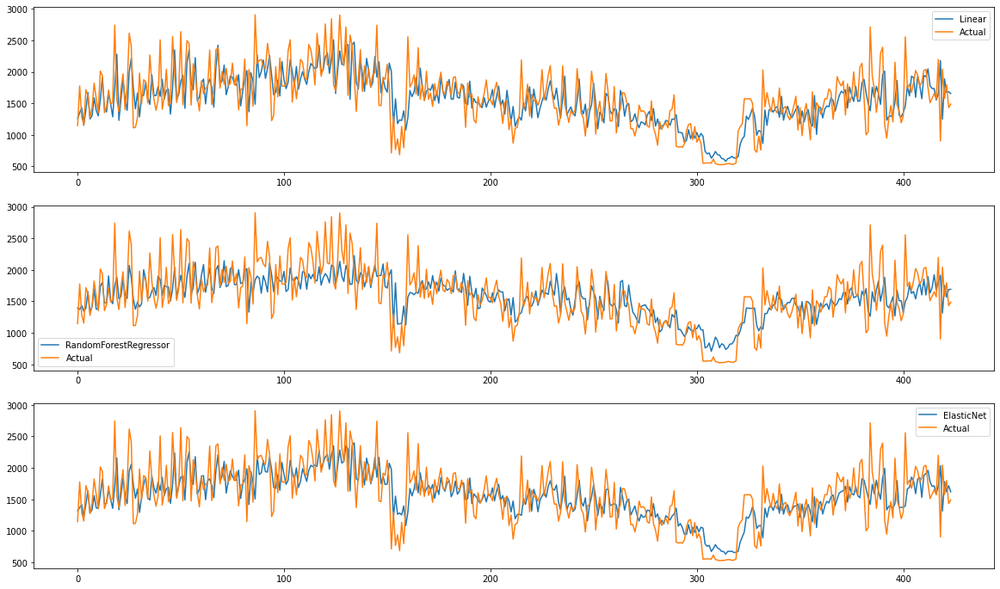

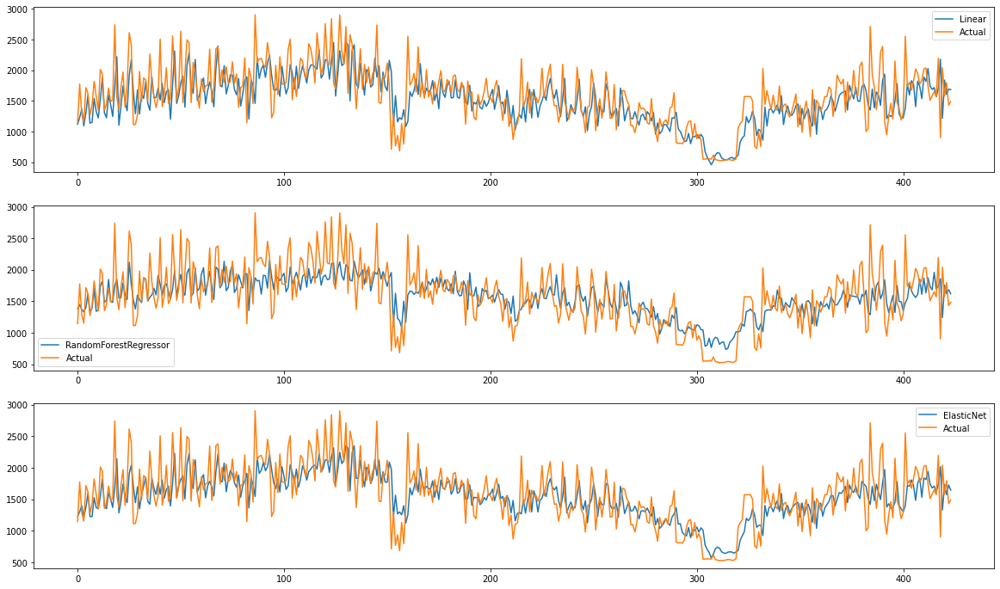

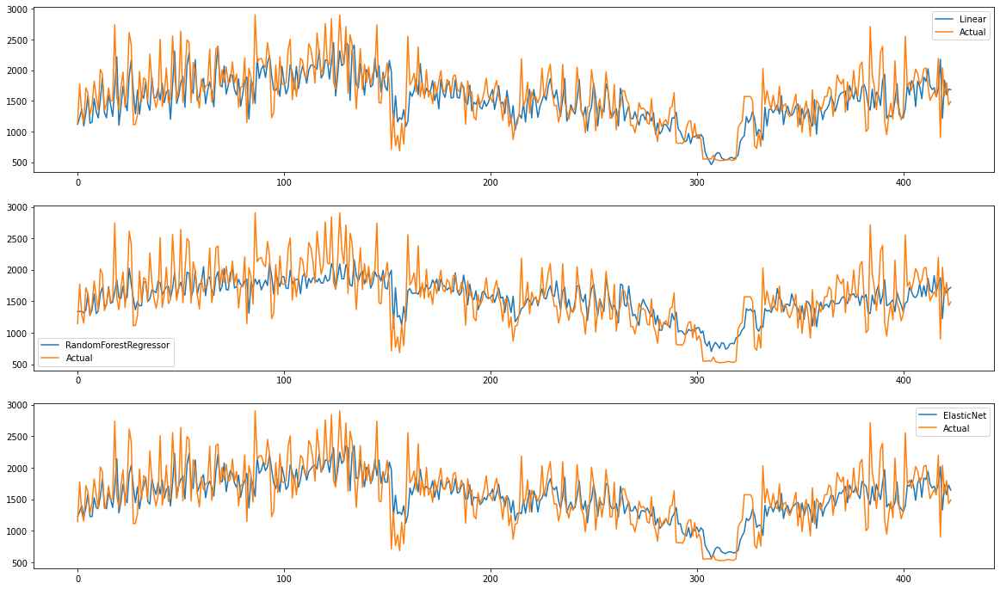

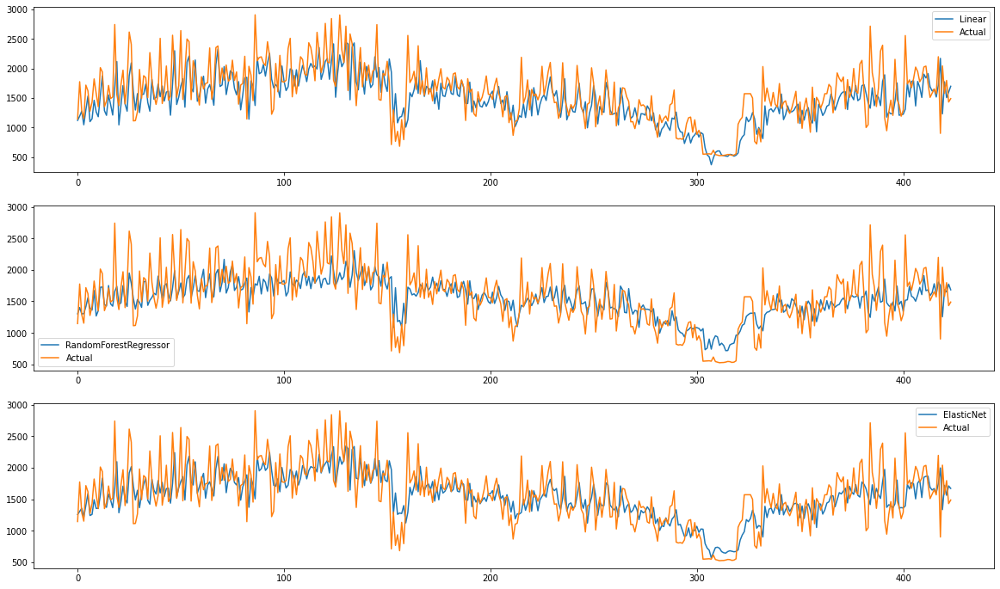

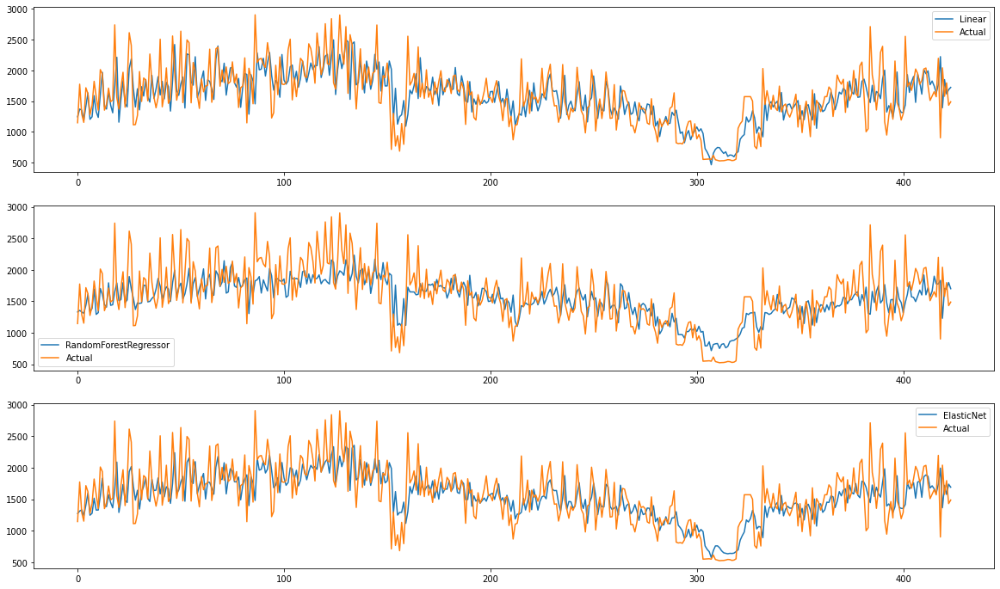

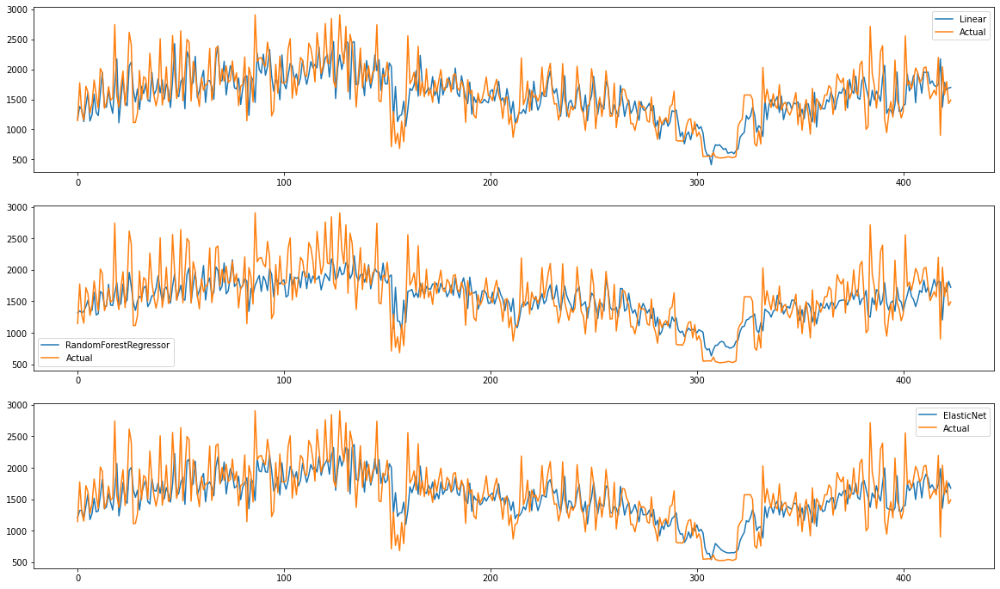

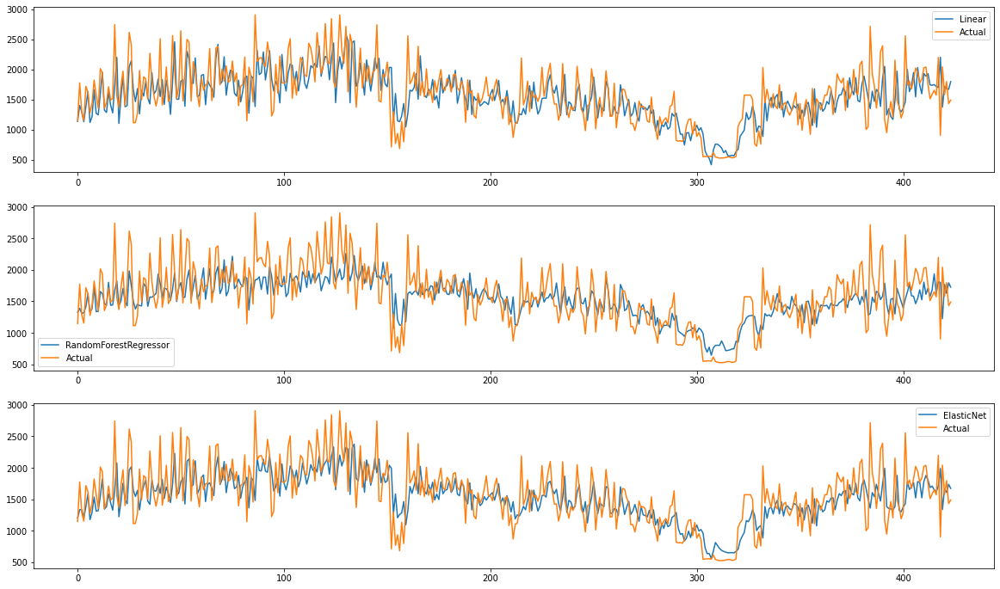

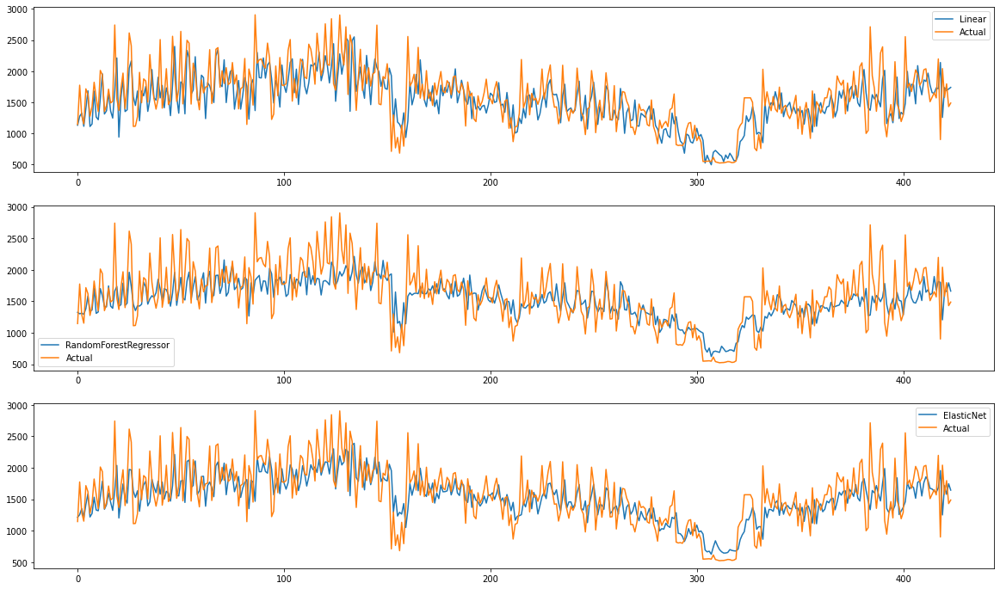

In [183]:
alpha_result = []
for k,v in features.items():
    print(k)
    cols = x_train_L.columns[v]
    alpha_result.append(Stacking_Regressor(x_train_L[cols],y_train_L,x_test_L[cols],y_test_L))

In [172]:
cols = x_train_L.columns[mi_mi_ccf]

Linear_r2:0.107575
 Linear_rmse:355.966953
 Linear_mse:126712.471808
 RandomForestRegressor_r2:-0.520235
 RandomForestRegressor_rmse:351.623557
 RandomForestRegressor_mse:123639.126090 elastic_r2:-0.056396
 elastic_rmse:350.903436
 elastic_mse:123133.221091


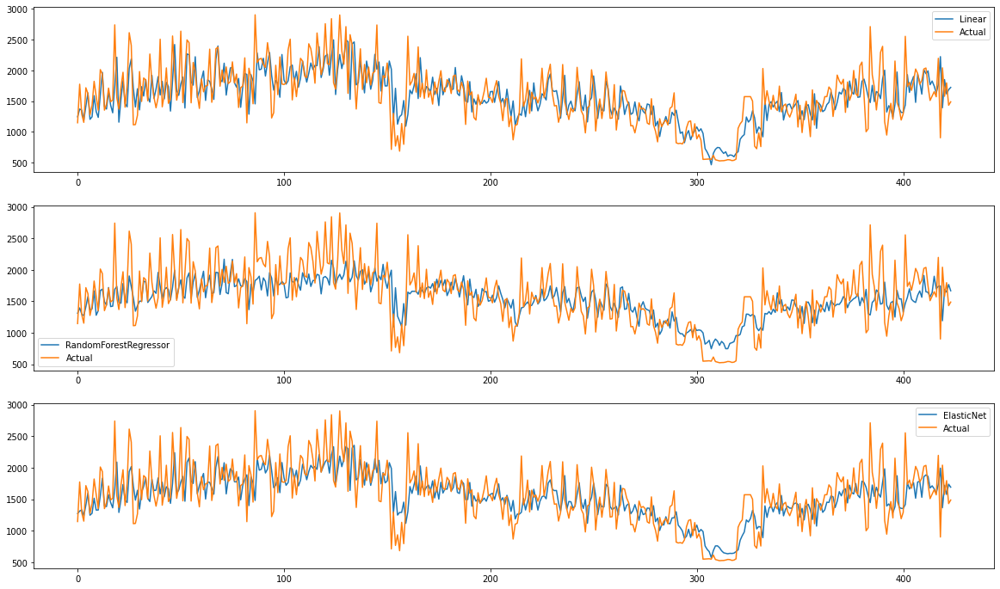

In [174]:
mi_mi_ccf = Stacking_Regressor(x_train_L[cols],y_train_L,x_test_L[cols],y_test_L)

In [212]:
def mRMR(selected,idx,metric_xy,metric_xx):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(selected)
        
        for i in selected:
            redundency_score+=metric_xx[idx][i]
        redundency_score/=(col_len)
        
#         for i in X_s:
#             relevance_score+=metric_xy[i]
#         relevance_score/=(col_len)
        

#         for i in range(col_len - 1):
#             for j in range(i+1,col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

In [213]:
def incremental_selection(x,metric):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx = []
    # stop = False
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm
    elif metric == 'MIC-MIC':
        metric_xy = mic_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-Pearson':
        metric_xy = mic_xy_norm
        metric_xx = pearson_norm
    elif metric == 'MIC-CCF':
        metric_xy = mic_xy_norm
        metric_xx = ccf_norm
    elif metric == 'CCF-Pearson':
        metric_xy = ccf_xy_norm
        metric_xx = pearson_norm
    elif metric == 'CCF-CCF':
        metric_xy = ccf_xy_norm
        metric_xx = ccf_norm    
    elif metric == 'CCF-MI':
        metric_xy = ccf_xy_norm
        metric_xx = mi_norm
    elif metric == 'CCF-MIC':
        metric_xy = ccf_xy_norm
        metric_xx = mic_norm       

        
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR(selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [214]:
def mRMR_score(selected,idx,metric_xy,metric_xx):
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        subset = selected + [idx]
        feature_num = len(subset)
        relevance_score = 0
        redundency_score = 0
        for i in subset:
            relevance_score+=metric_xy[i]
        relevance_score/= feature_num 
        for i in range(feature_num-1):
            for j in range(i+1,feature_num):
                redundency_score+=metric_xx[subset[i]][subset[j]]
        redundency_score/= (feature_num)*(feature_num-1)*0.5
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

In [215]:
def forward_selection(x,metric):
    X = np.array(x)
#     Y = np.array(y)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    prev_score = 0
    max_score = 0
    metric_xy = []
    metric_xx = []
    
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm
    elif metric == 'MIC-MIC':
        metric_xy = mic_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-Pearson':
        metric_xy = mic_xy_norm
        metric_xx = pearson_norm
    elif metric == 'CCF-Pearson':
        metric_xy = ccf_xy_norm
        metric_xx = pearson_norm
    elif metric == 'CCF-CCF':
        metric_xy = ccf_xy_norm
        metric_xx = ccf_norm
        
    while len(rest)>0 :
        id_max = rest[0]
        for idx in rest:
            print(selected+[idx])
            temp_score = mRMR_score( selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        
        if prev_score >=max_score:        
             return selected
#              break                
        prev_score = max_score
        selected = selected + [id_max]
        rest.remove(id_max)
        
        print("selected:",selected,"delta_score:",max_score,end = "\r",flush=True)
    
    return selected

In [216]:
X_mat = x_train_L.values
y_mat = y_train_L.values

### MI

In [22]:
mi_xy = mutual_info_regression(x_train_L,y_train_L)

In [90]:
mi_xy_li = pd.Series(mi_xy)

In [91]:
mi_xy_li.sort_values(ascending=False,inplace=True)

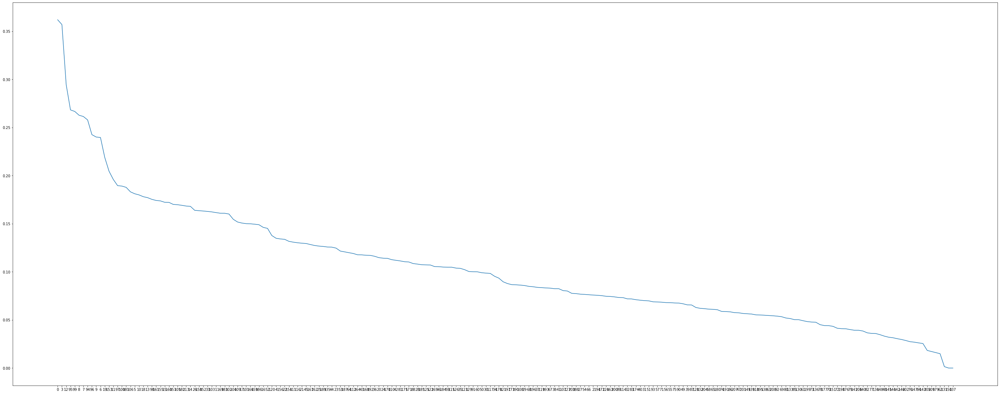

In [98]:
plt.figure(figsize=(50,20))
plt.xticks(range(len(idxs)),idxs)
plt.plot(mi_xy_li.values)

In [102]:
top_ten = 10

In [103]:
idxs = list(mi_xy_li.index)

In [104]:
subsets = idxs[:top_ten]

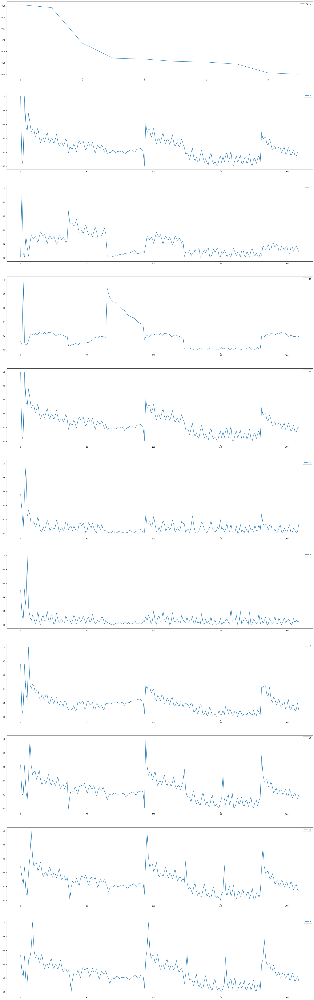

In [106]:
fig,ax = plt.subplots(len(subsets)+1,1,figsize=(30,100))
ax[0].set_xticks(range(len(subsets)),subsets)
ax[0].plot(mi_xy_li[subsets].values,label='mi_xy')
# 
# ax[0].set_xticklabels(labels = x_train_L.columns[subsets],rotation=30)
ax[0].legend()
for i in range(1,len(subsets)+1):
    ax[i].plot(ccf_xx[i-1,:],label=subsets[i-1])
    ax[i].legend()
fig.savefig("top_features_in_mi_xy.png")

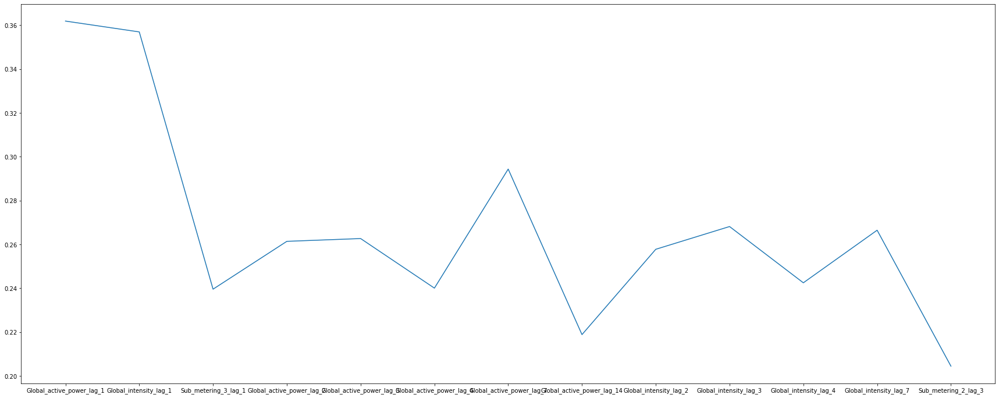

In [662]:
plt.figure(figsize=(30,12))
plt.plot(x_train_L.columns[subsets],mi_xy[subsets])

In [23]:
mi_xx = np.zeros([x_train_L.shape[1],x_train_L.shape[1]])

for i in range(mi_xx.shape[1]):
    for j in range(mi_xx.shape[1]):
        mi_xx[i][j] = mutual_info_regression(X_mat[:,i].reshape(-1,1),X_mat[:,j])
    print(i+1,'/',mi_xx.shape[1],end='\r',flush=True)

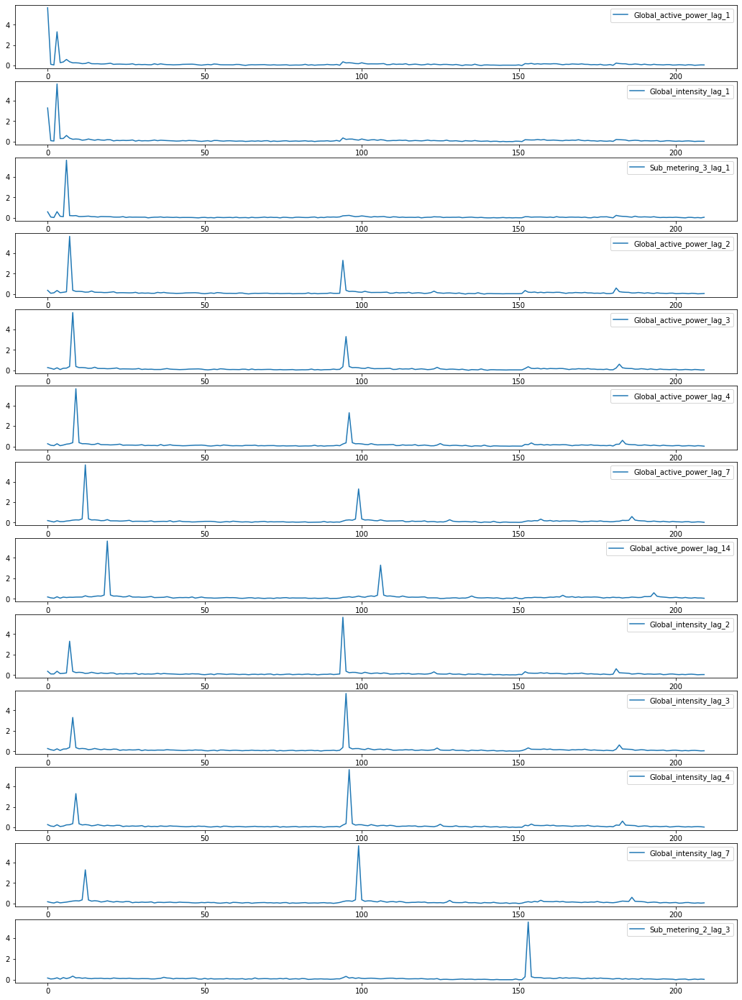

In [524]:
fig,ax = plt.subplots(len(subsets),1,figsize = (18,25))
for i in range(len(subsets)):
    ax[i].plot(mi_xx[subsets[i]],label = x_train_L.columns[subsets[i]])
    ax[i].legend()

### MI-MI

In [127]:
mi_mi_cols = x_train_L.columns[features_dict['MI-MI']]

In [128]:
len(mi_mi_cols)

94

In [135]:
mi_mi_linear_rmse = []

In [136]:
for i in range(len(mi_mi_cols)):
    i_cols = mi_mi_cols[:i+1]
    rmse = Linear_Regressor(x_train_L[i_cols],y_train_L,x_test_L[i_cols],y_test_L)
    mi_mi_linear_rmse.append(rmse)
    print(i+1,'/',len(mi_mi_cols),end='\r',flush=True)

21 347.82968929760415


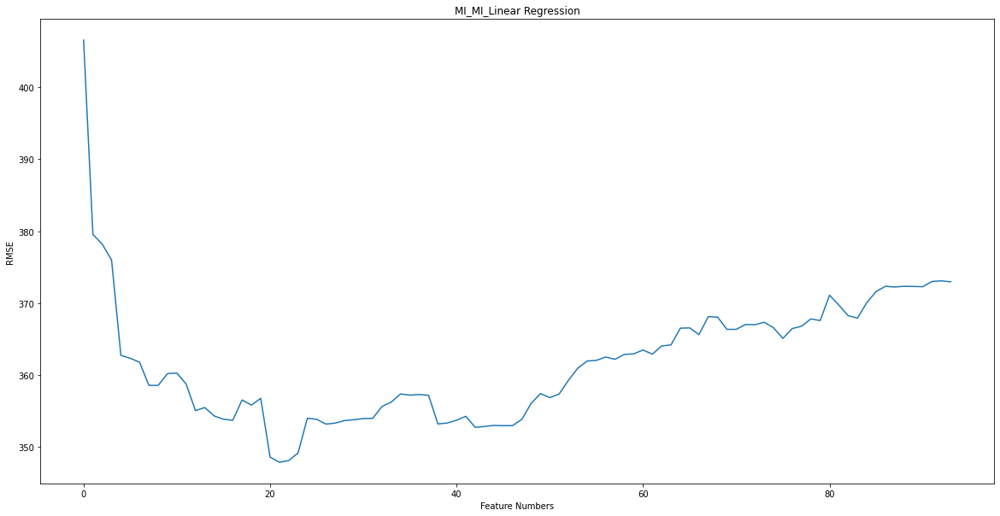

In [137]:
plt.figure(figsize=(20,10))
plt.title("MI_MI_Linear Regression")
plt.plot(mi_mi_linear_rmse)
plt.ylabel("RMSE")
plt.xlabel("Feature Numbers")
print(mi_mi_linear_rmse.index(min(mi_mi_linear_rmse)),min(mi_mi_linear_rmse))

In [138]:
mi_mi_forest_rmse = []
for i in range(len(mi_mi_cols)):
    i_cols = mi_mi_cols[:i+1]
    rmse = Forest_Regressor(x_train_L[i_cols],y_train_L,x_test_L[i_cols],y_test_L)
    mi_mi_forest_rmse.append(rmse)
    print(i+1,'/',len(mi_mi_cols),end='\r',flush=True)

44 341.3959726646171


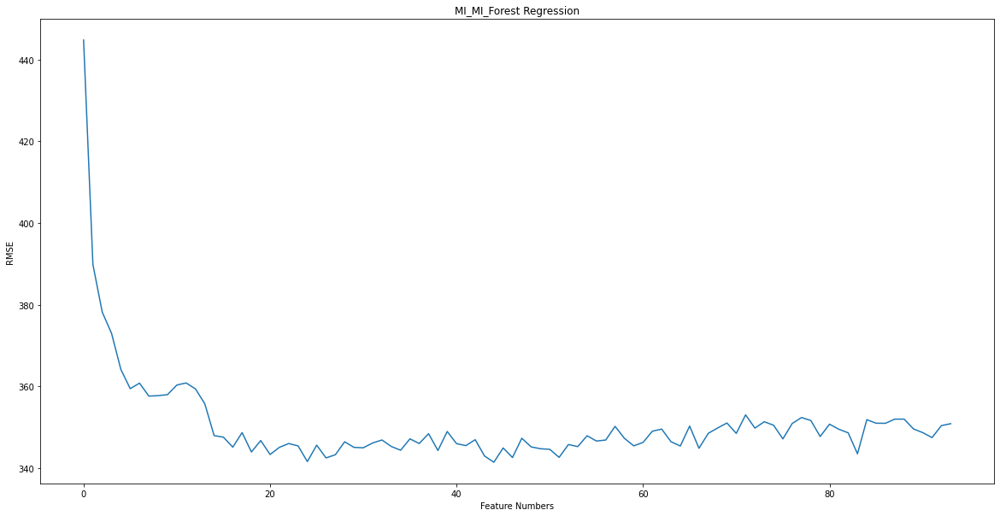

In [139]:
plt.figure(figsize=(20,10))
plt.title("MI_MI_Forest Regression")
plt.plot(mi_mi_forest_rmse)
plt.ylabel("RMSE")
plt.xlabel("Feature Numbers")
print(mi_mi_forest_rmse.index(min(mi_mi_forest_rmse)),min(mi_mi_forest_rmse))

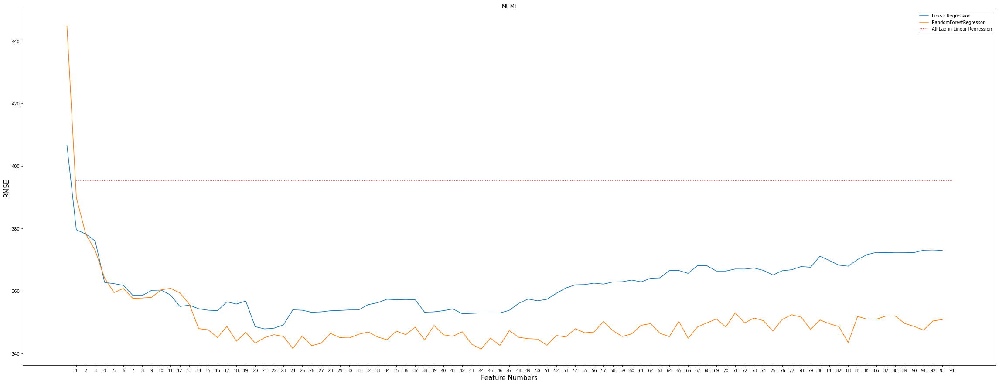

In [151]:
plt.figure(figsize=(40,15))
plt.title("MI_MI")
plt.hlines(395.259193,xmin = 1,xmax = len(mi_mi_forest_rmse),label='All Lag in Linear Regression',color='r',linestyle='dotted')
plt.plot(mi_mi_linear_rmse,label='Linear Regression')
# plt.hlines(346.847201,xmin = 1,xmax = len(mi_ccf_forest),label='All Lag in RandomForest Regression')
plt.plot(mi_mi_forest_rmse,label='RandomForestRegressor')
plt.xticks(range(1,len(mi_mi_forest_rmse)+1))
plt.ylabel("RMSE",fontsize=15)
plt.xlabel("Feature Numbers",fontsize=15)
plt.legend()
plt.savefig("MI_MI_On_2_regressor.png")

### MI CCF

In [37]:
mi_ccf_cols = x_train_L.columns[features_dict['MI-CCF']]

In [38]:
len(mi_ccf_cols)

48

In [39]:
mi_ccf_cols

Index(['Global_active_power_lag_1', 'Sub_metering_2_lag_10',
       'Sub_metering_2_lag_16', 'Sub_metering_2_lag_11',
       'Sub_metering_2_lag_3', 'Global_intensity_lag_1',
       'Sub_metering_2_lag_9', 'Sub_metering_2_lag_7', 'Sub_metering_2_lag_19',
       'Global_reactive_power_lag_1', 'Sub_metering_2_lag_6',
       'Sub_metering_2_lag_5', 'Global_active_power_lag_7',
       'Sub_metering_2_lag_8', 'Sub_metering_2_lag_2', 'Sub_metering_3_lag_1',
       'Sub_metering_2_lag_17', 'Sub_metering_2_lag_4', 'Sub_metering_2_lag_1',
       'Global_intensity_lag_3', 'Sub_metering_2_lag_20',
       'Sub_metering_1_lag_14', 'Sub_metering_2_lag_12', 'Voltage_lag_18',
       'Sub_metering_2_lag_25', 'Global_active_power_lag_2',
       'Sub_metering_2_lag_21', 'Global_intensity_lag_7',
       'Sub_metering_2_lag_15', 'Sub_metering_2_lag_18',
       'Global_active_power_lag_3', 'Voltage_lag_30', 'Sub_metering_2_lag_14',
       'Global_intensity_lag_2', 'Sub_metering_1_lag_5',
       'Sub_meterin

In [131]:
mi_ccf_linear_rmse = []

In [132]:
for i in range(len(mi_ccf_cols)):
    i_cols = mi_ccf_cols[:i+1]
    rmse = Linear_Regressor(x_train_L[i_cols],y_train_L,x_test_L[i_cols],y_test_L)
    mi_ccf_linear_rmse.append(rmse)
    print(i+1,'/',len(mi_ccf_cols),end='\r',flush=True)

In [58]:
len(mi_ccf_linear_rmse)

48

In [61]:
mi_ccf_series = pd.Series(data = mi_ccf_linear_rmse,index = range(1,len(mi_ccf_linear_rmse)+1))

22 352.234489511282


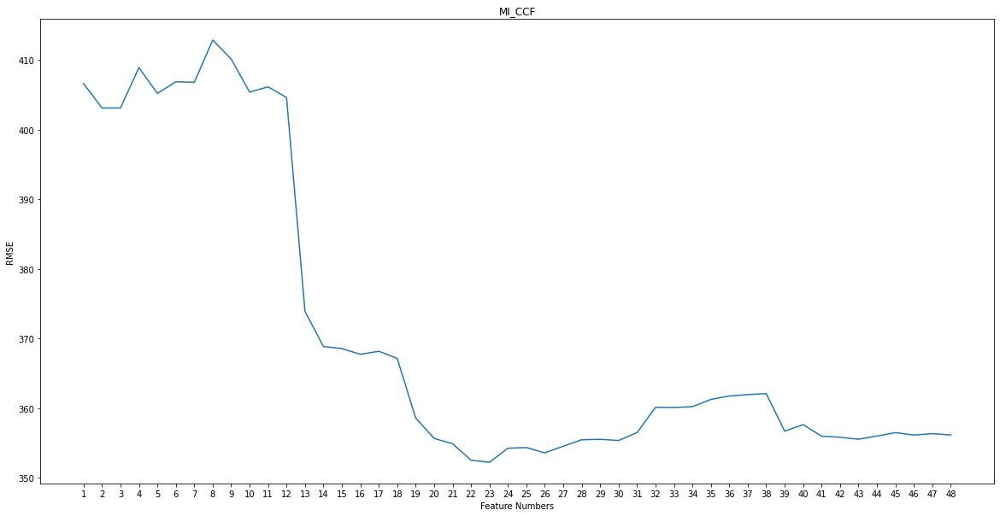

In [68]:
plt.figure(figsize=(20,10))
plt.title("MI_CCF_Linear Regression")
plt.plot(mi_ccf_series.index,mi_ccf_series)
plt.ylabel("RMSE")
plt.xlabel("Feature Numbers")
plt.xticks(mi_ccf_series.index)
plt.savefig("MI_CCF_RMSE.png")
print(mi_ccf_linear_rmse.index(min(mi_ccf_linear_rmse)),min(mi_ccf_linear_rmse))

In [72]:
mi_ccf_forest_rmse = []
for i in range(len(mi_ccf_cols)):
    i_cols = mi_ccf_cols[:i+1]
    rmse = Forest_Regressor(x_train_L[i_cols],y_train_L,x_test_L[i_cols],y_test_L)
    mi_ccf_forest_rmse.append(rmse)
    print(i+1,'/',len(mi_ccf_cols),end='\r',flush=True)

In [74]:
mi_ccf_forest = pd.Series(data = mi_ccf_forest_rmse,index = range(1,len(mi_ccf_forest_rmse)+1))

In [158]:
mi_ccf_forest_rmse.index(min(mi_ccf_forest))

43

351.6836268315233


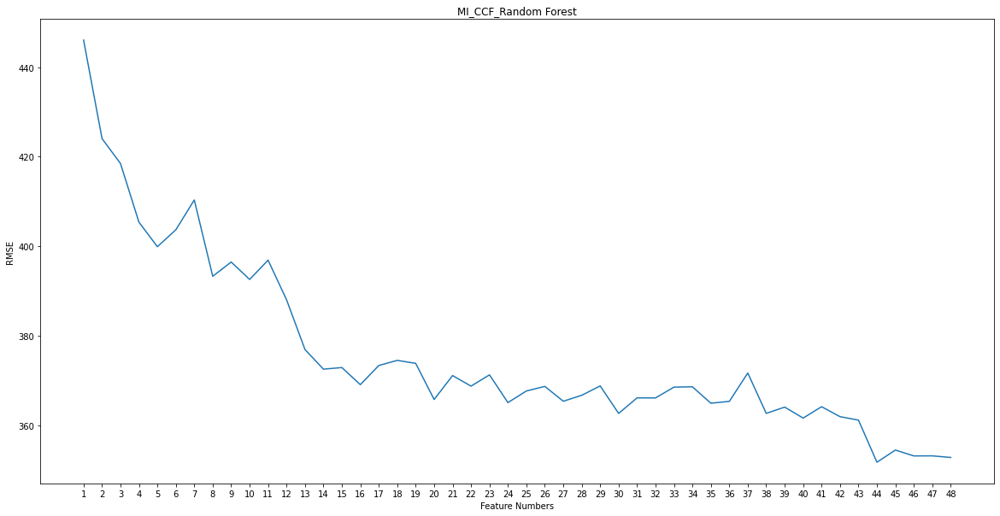

In [154]:
plt.figure(figsize=(20,10))
plt.title("MI_CCF_Random Forest")
plt.plot(mi_ccf_forest.index,mi_ccf_forest)
plt.ylabel("RMSE")
plt.xlabel("Feature Numbers")
plt.xticks(mi_ccf_forest.index)
plt.savefig("MI_CCF_RMSE_Random_Forest.png")
print(min(mi_ccf_forest))

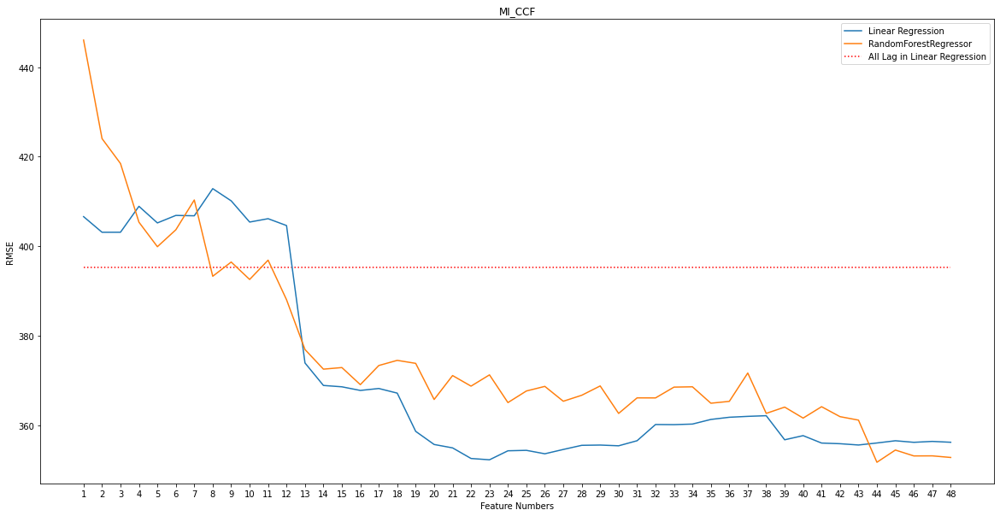

In [148]:
plt.figure(figsize=(20,10))
plt.title("MI_CCF")
plt.hlines(395.259193,xmin = 1,xmax = len(mi_ccf_forest),label='All Lag in Linear Regression',color='r',linestyle='dotted')
plt.plot(mi_ccf_series,label='Linear Regression')
# plt.hlines(346.847201,xmin = 1,xmax = len(mi_ccf_forest),label='All Lag in RandomForest Regression')
plt.plot(mi_ccf_forest.index,mi_ccf_forest,label='RandomForestRegressor')
plt.xticks(mi_ccf_forest.index)
plt.ylabel("RMSE")
plt.xlabel("Feature Numbers")
plt.legend()
plt.savefig("MI_CCF_On_2_regressor.png")

## Incremental

Normalization All Metrics

In [191]:
ccf_xy_norm = (ccf_xy_flat/sum(ccf_xy_flat))

mic_xy_norm = (mic_xy/sum(mic_xy))

mi_xy_norm = (mi_xy/sum(mi_xy))

In [193]:
mi_norm = mi_xx.copy()

for i in range(mi_norm.shape[1]):
    mi_norm[i,:]/=sum(mi_norm[i,:])
    
ccf_norm = ccf_xx.copy()

for i in range(ccf_norm.shape[1]):
    ccf_norm[i,:]/=sum(ccf_norm[i,:])
    
pearson_norm = pearson_xx.copy()

for i in range(pearson_norm.shape[1]):
    pearson_norm[i,:]/=sum(pearson_norm[i,:])

mic_norm = mic_xx.copy()

for i in range(mic_norm.shape[1]):
    mic_norm[i,:]/=sum(mic_norm[i,:])

In [217]:
metric_list = ['MI-MI','MI-CCF','MI-CCF-Norm','MI-MIC','MI-Pearson','MIC-MI','MIC-MIC','MIC-Pearson','MIC-CCF','CCF-Pearson','CCF-MI','CCF-MIC']
features_dict = {}
for m in metric_list:
    features_dict[m] = incremental_selection(x_train_L,m)

MI-MI
MI-CCFed:[0, 12, 135, 169, 8, 64, 7, 33, 6, 161, 153, 1, 96, 52, 19, 126, 4, 88, 113, 181, 5, 11, 160, 155, 3, 125, 192, 186, 157, 129, 183, 166, 44, 182, 81, 152, 189, 53, 158, 123, 18, 91, 100, 59, 109, 99, 95, 45, 97, 94, 149, 116, 43, 122, 159, 9, 60, 127, 197, 104, 187, 42, 67, 14, 36, 103, 124, 50, 111, 15, 203, 154, 151, 156, 167, 139, 68, 46, 175, 132, 106, 138, 185, 162, 2, 26, 128, 170, 148, 120, 168, 184, 196, 164],delta_score:0.0002984986609805146
MI-CCF-Norm, 160, 166, 161, 153, 3, 159, 157, 169, 1, 156, 155, 12, 158, 152, 6, 167, 154, 5, 95, 170, 135, 162, 81, 175, 7, 171, 99, 165, 168, 8, 93, 164, 94, 126, 173, 178, 4, 96, 52, 88, 163, 125, 19, 172, 174, 129, 181],delta_score:0.002376637706024587
MI-MICed:[0, 160, 12, 3, 166, 95, 99, 7, 19, 96, 94, 8, 169, 9, 1, 18, 6, 161, 113, 11, 33, 155, 100, 106, 159, 97, 105, 26, 153, 15, 13, 181, 81, 109, 5, 10, 14, 103, 52, 98, 104, 120, 158, 152, 102, 17, 182, 116, 88, 157, 44, 111, 183, 16, 45, 22, 101, 25, 23, 21, 64, 18

In [218]:
for k,v in features_dict.items():
    print(k,len(v))

MI-MI 94
MI-CCF 48
MI-CCF-Norm 62
MI-MIC 85
MI-Pearson 62
MIC-MI 197
MIC-MIC 41
MIC-Pearson 36
MIC-CCF 36
CCF-Pearson 67
CCF-MI 109
CCF-MIC 94


MI-MI
Linear_r2:0.132989
 Linear_rmse:372.942871
 Linear_mse:139086.384825
 RandomForestRegressor_r2:-0.314930
 RandomForestRegressor_rmse:346.586456
 RandomForestRegressor_mse:120122.171583 elastic_r2:-0.095619
 elastic_rmse:354.966175
 elastic_mse:126000.985506
MI-CCF
Linear_r2:0.088507
 Linear_rmse:356.152922
 Linear_mse:126844.904102
 RandomForestRegressor_r2:-0.458959
 RandomForestRegressor_rmse:353.838218
 RandomForestRegressor_mse:125201.484603 elastic_r2:-0.065733
 elastic_rmse:353.358521
 elastic_mse:124862.244363
MI-CCF-Norm
Linear_r2:0.144762
 Linear_rmse:367.239043
 Linear_mse:134864.514947
 RandomForestRegressor_r2:-0.155690
 RandomForestRegressor_rmse:343.177768
 RandomForestRegressor_mse:117770.980259 elastic_r2:-0.022674
 elastic_rmse:352.405904
 elastic_mse:124189.921048
MI-MIC
Linear_r2:0.174256
 Linear_rmse:365.950000
 Linear_mse:133919.402669
 RandomForestRegressor_r2:-0.447875
 RandomForestRegressor_rmse:349.949762
 RandomForestRegressor_mse:122464.835877 elastic_r

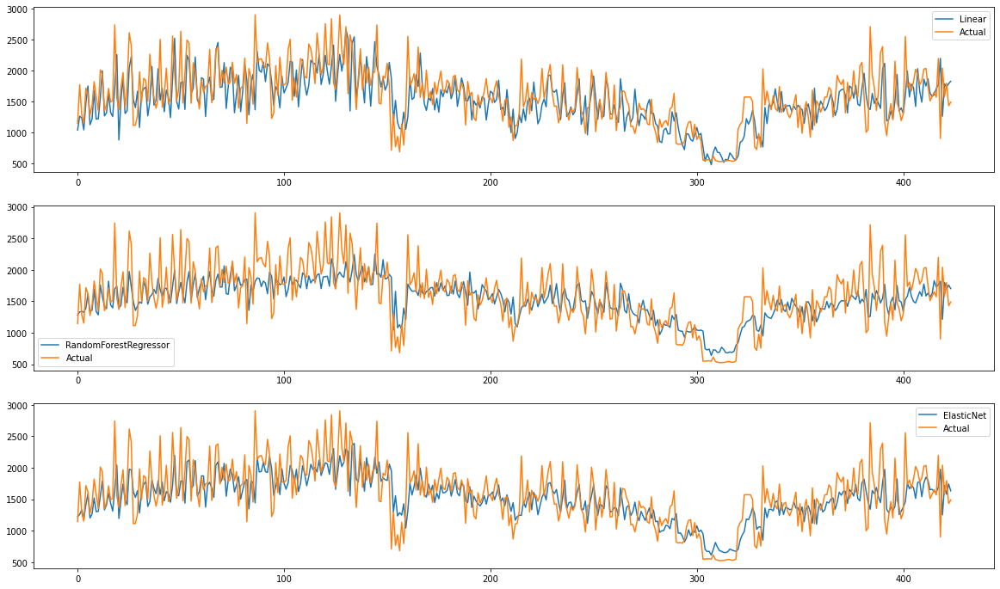

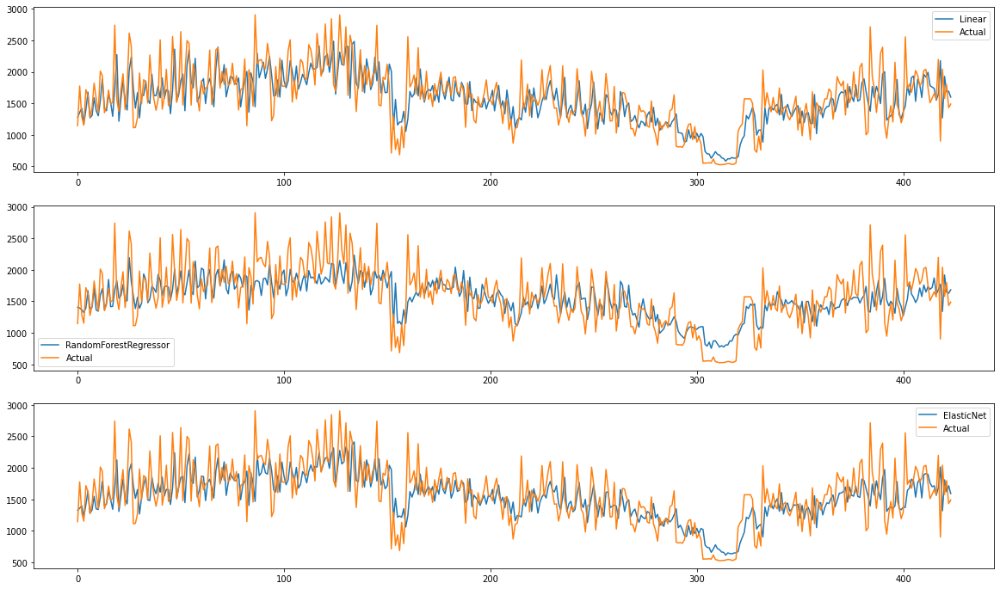

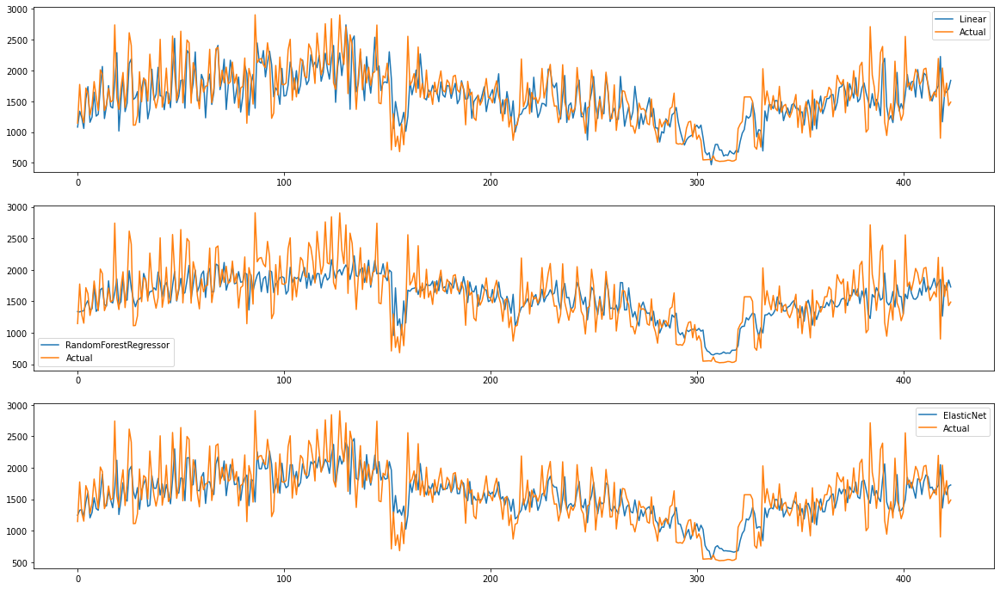

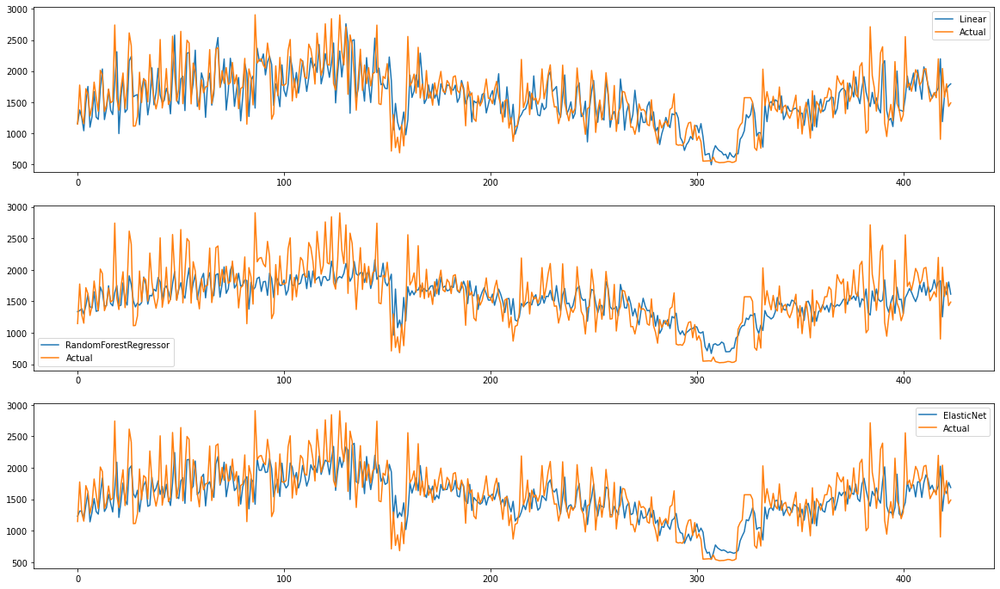

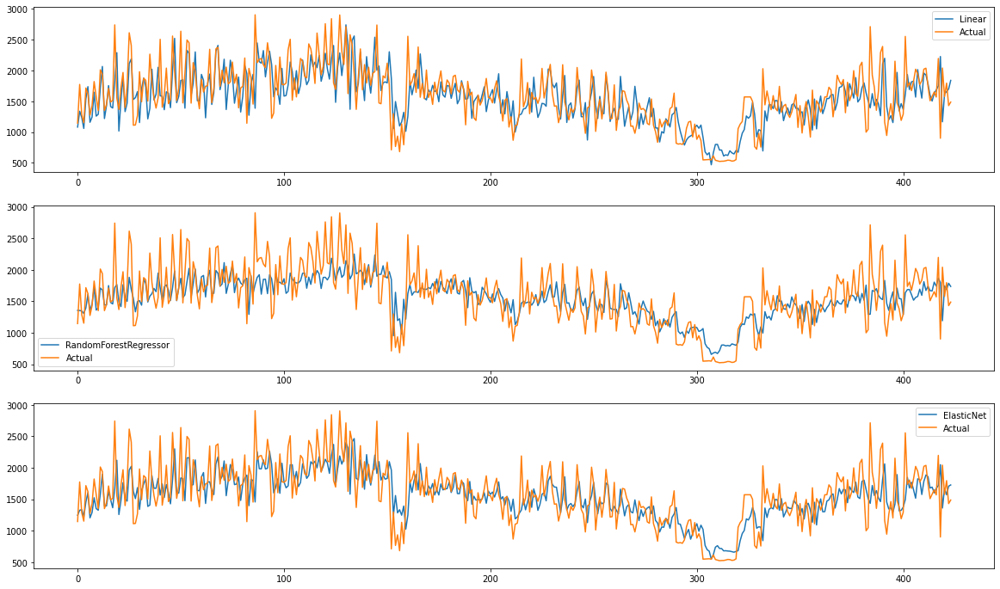

...

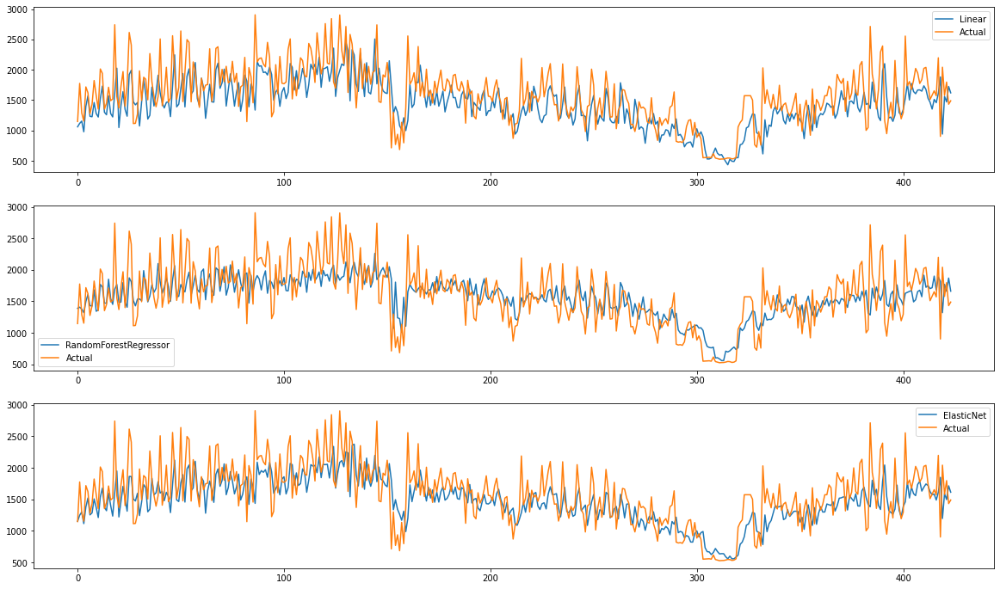

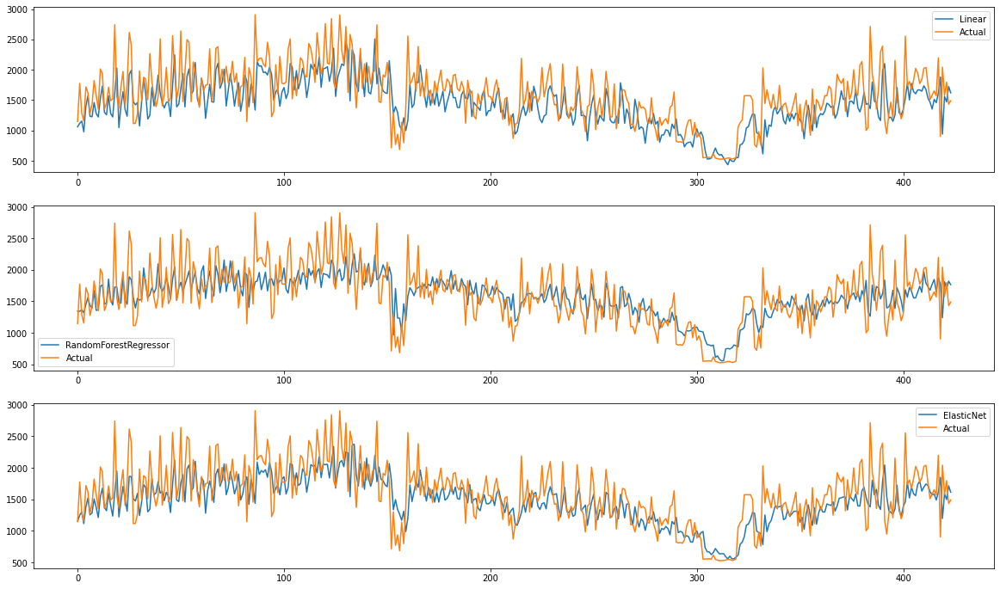

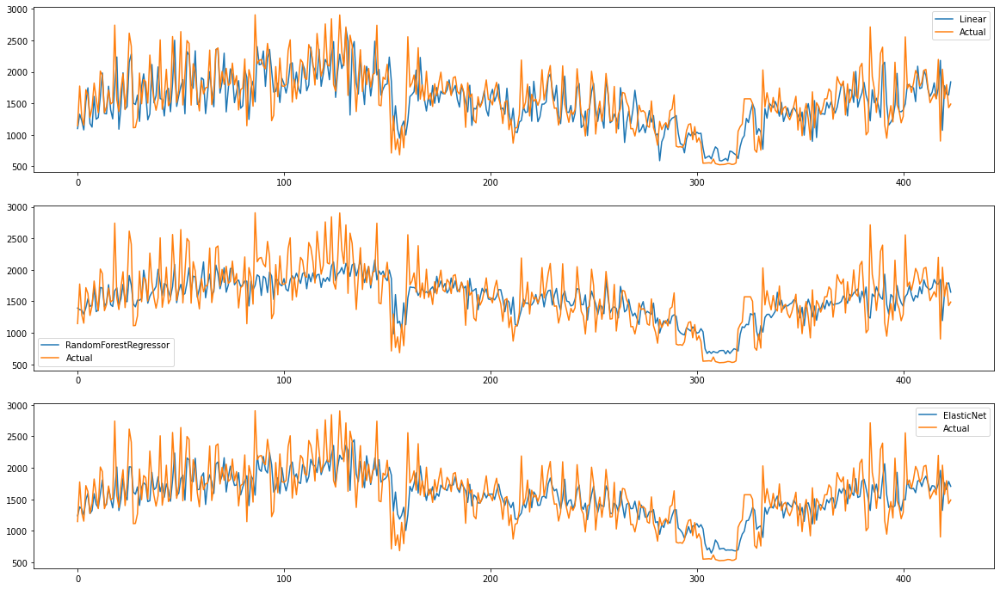

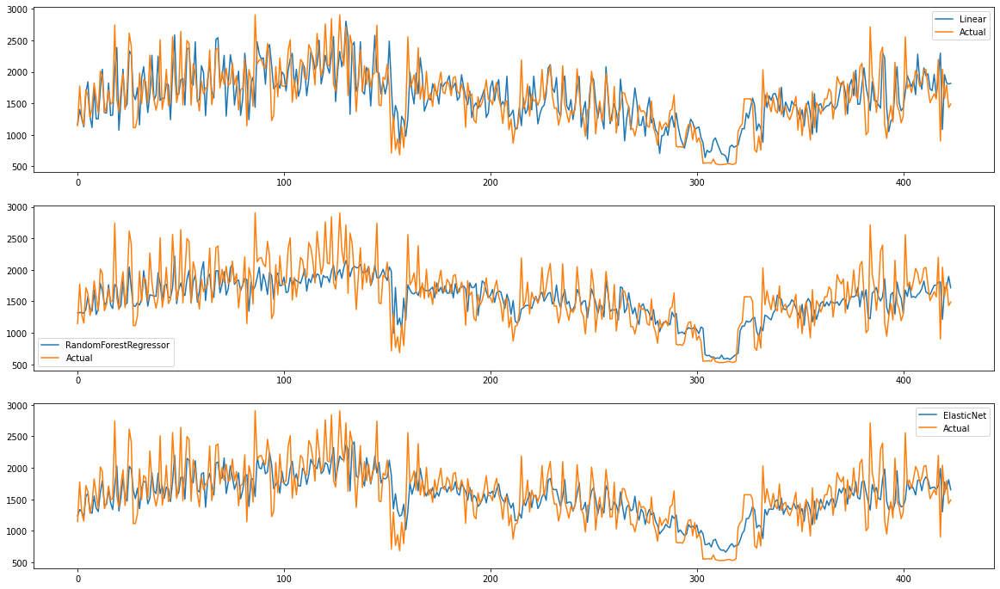

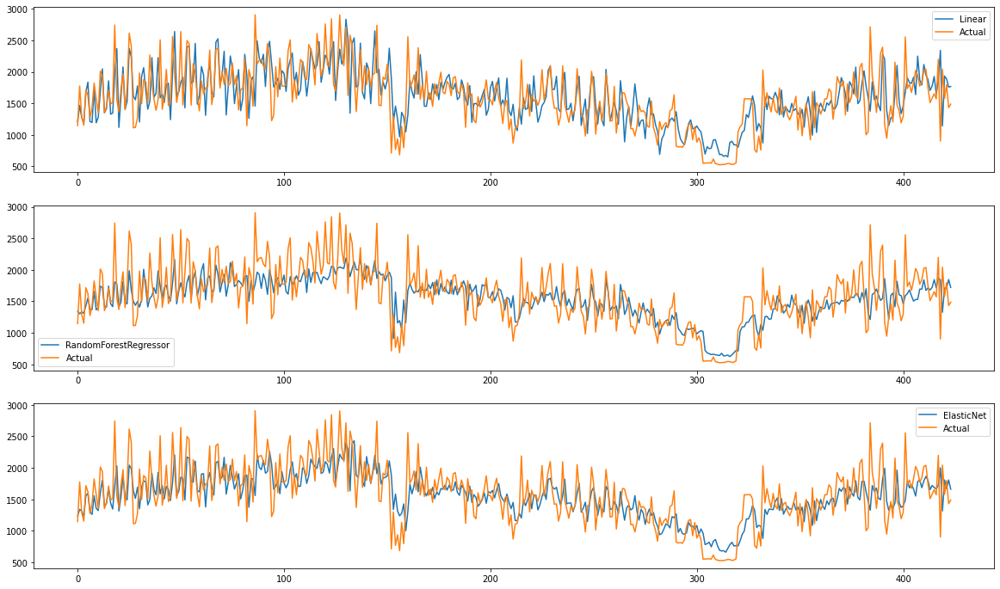

In [219]:
result = []
for i in metric_list:
    cols = x_train_L.columns[features_dict[i]]
    print(i)
    result.append(Stacking_Regressor(x_train_L[cols],y_train_L,x_test_L[cols],y_test_L))

MI-Pearson
Linear_r2:-0.974142
 Linear_rmse:416.612696
 Linear_mse:173566.138475
 RandomForestRegressor_r2:-0.829892
 RandomForestRegressor_rmse:433.065867
 RandomForestRegressor_mse:187546.045424
MI-MI
Linear_r2:-0.893414
 Linear_rmse:406.583063
 Linear_mse:165309.786943
 RandomForestRegressor_r2:-0.675162
 RandomForestRegressor_rmse:445.262199
 RandomForestRegressor_mse:198258.425581
MIC-Pearson
Linear_r2:-0.966176
 Linear_rmse:412.454138
 Linear_mse:170118.415638
 RandomForestRegressor_r2:-1.053475
 RandomForestRegressor_rmse:442.876609
 RandomForestRegressor_mse:196139.690808
CCF-Pearson
Linear_r2:-20.180699
 Linear_rmse:576.015439
 Linear_mse:331793.786285
 RandomForestRegressor_r2:-6.912960
 RandomForestRegressor_rmse:585.235561
 RandomForestRegressor_mse:342500.661647
CCF-Corr
Linear_r2:-28.060903
 Linear_rmse:550.901400
 Linear_mse:303492.352567
 RandomForestRegressor_r2:-4.373236
 RandomForestRegressor_rmse:607.593282
 RandomForestRegressor_mse:369169.596017
MIC-MIC
Linear_r2:

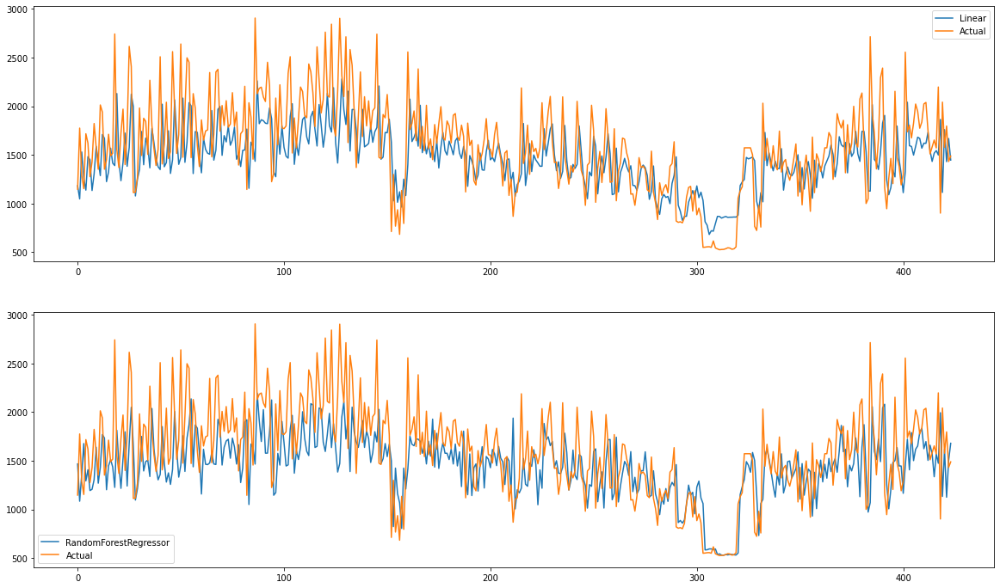

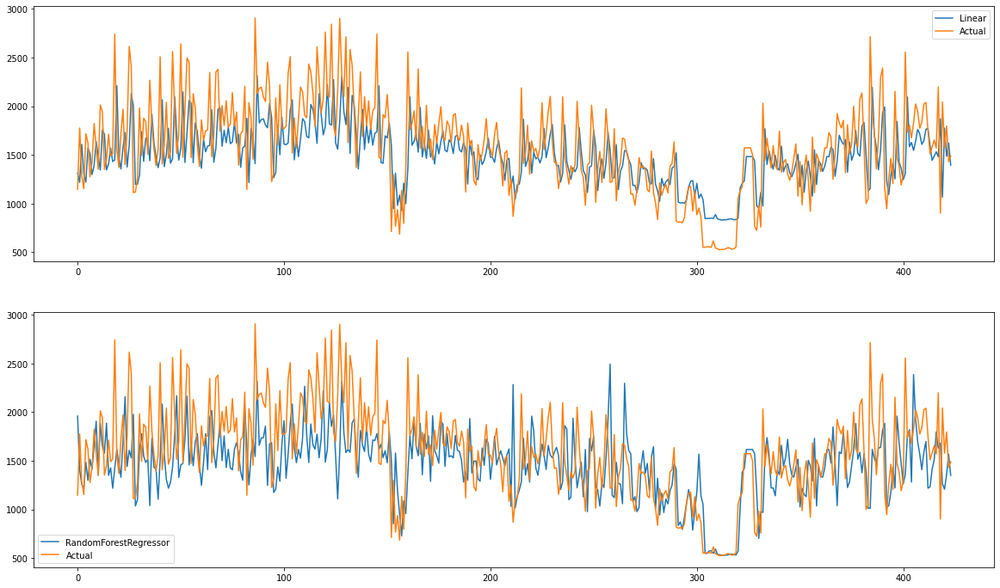

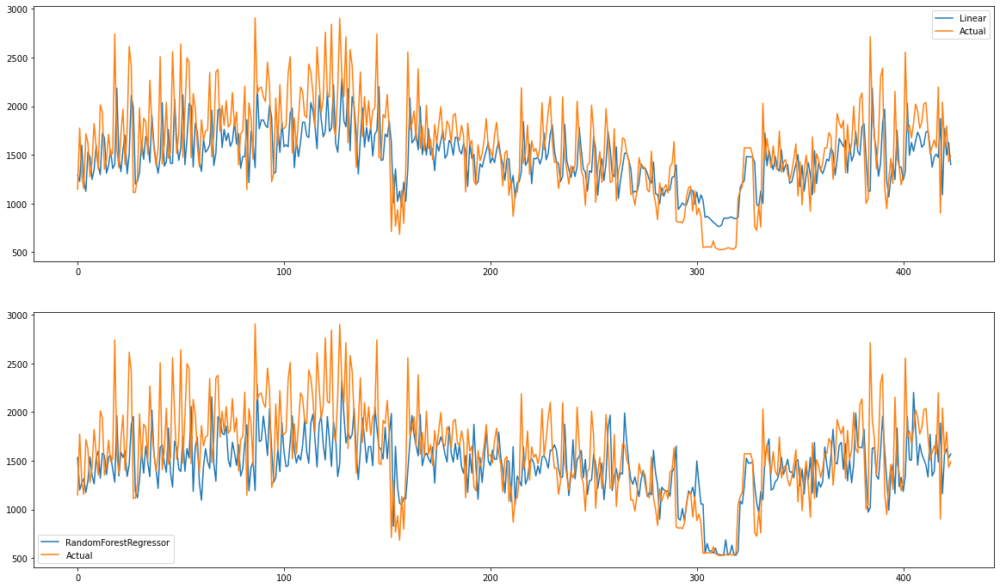

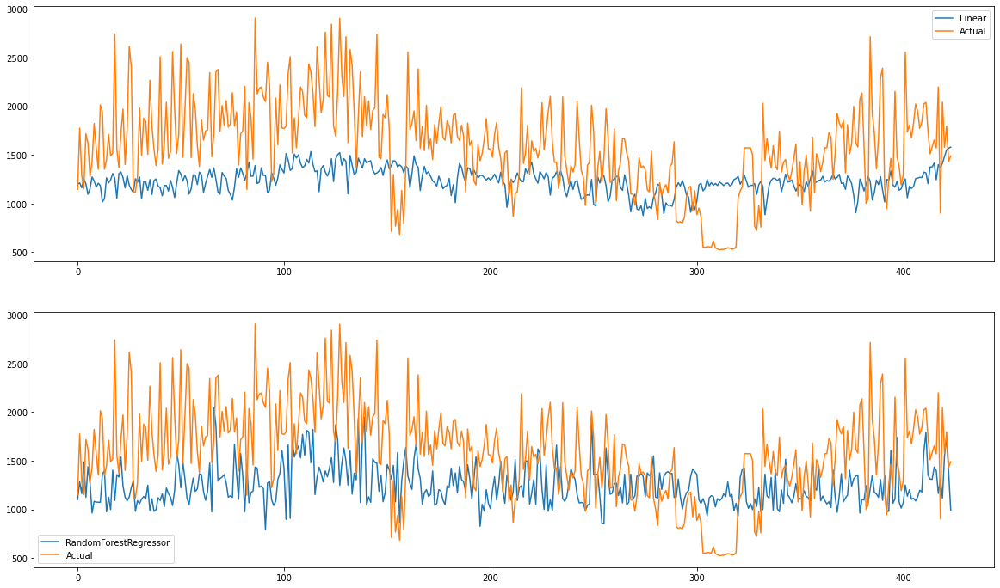

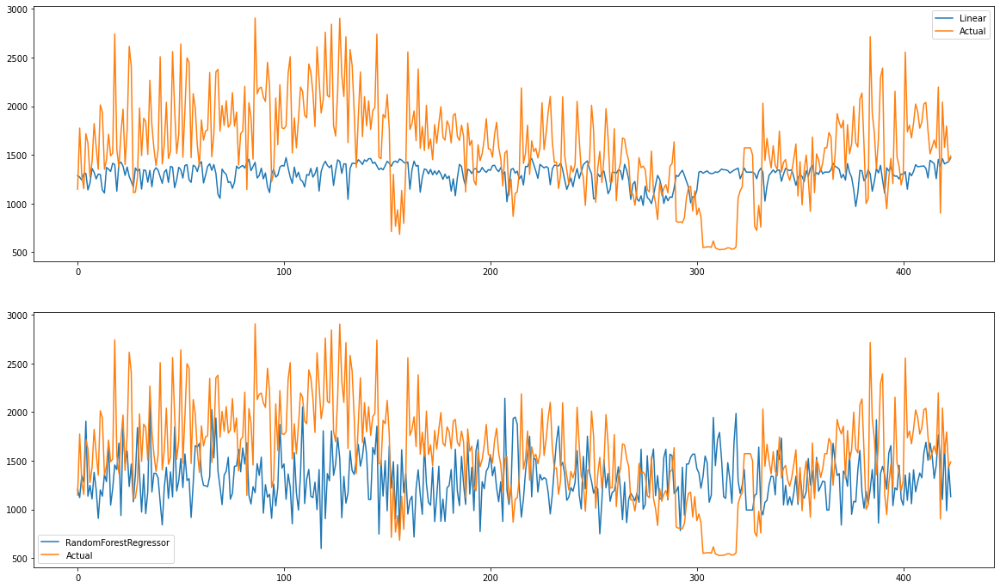

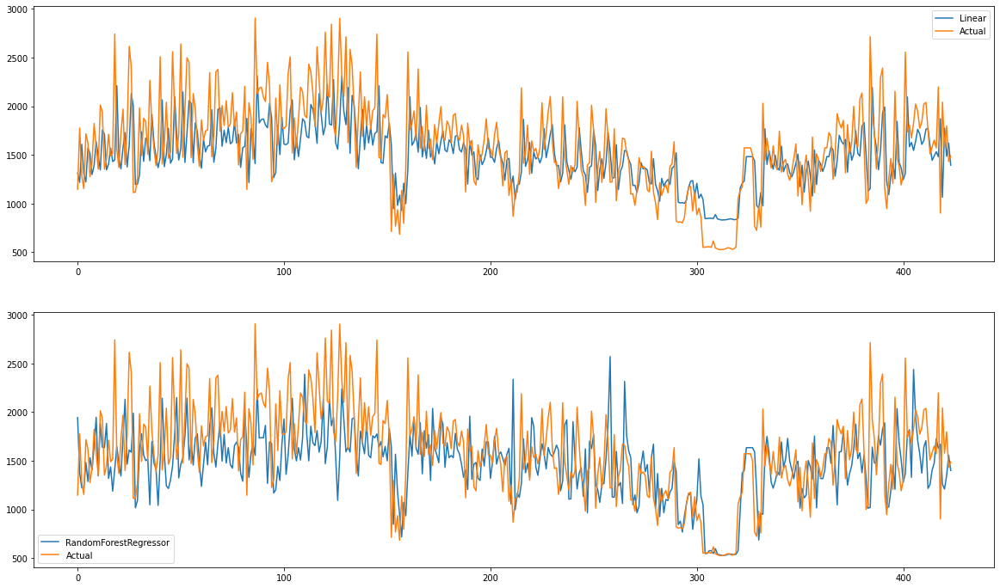

In [650]:
for i in metric_forward:
    cols = x_train_L.columns[forward_dict[i]]
    print(i)
    result.append(Stacking_Regressor(x_train_L[cols],y_train_L,x_test_L[cols],y_test_L))

### MIC

In [32]:
mic_xy = cstats(X_mat.T,y_mat.T.reshape(1,-1),est="mic_approx")[0]

In [33]:
len(mic_xy)

210

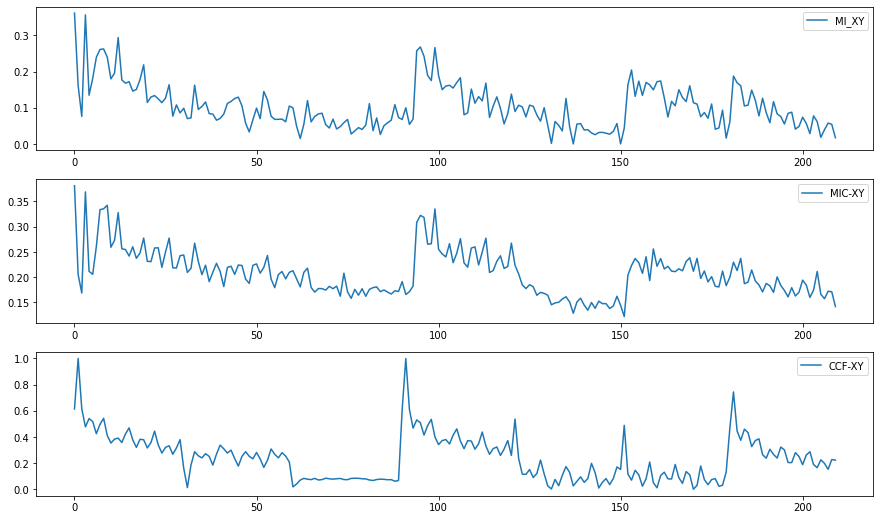

In [34]:
fig,ax = plt.subplots(3,1,figsize=(15,9))
ax[0].plot(mi_xy,label='MI_XY')
ax[0].legend()
ax[1].plot(mic_xy,label = 'MIC-XY')
ax[1].legend()
ax[2].plot(ccf_xy_flat,label = 'CCF-XY')
ax[2].legend()

In [45]:
mic_xx = np.zeros([x_train_L.shape[1],x_train_L.shape[1]])
X_mat_T = X_mat.T
for i in range(mic_xx.shape[1]):
    %time mic_xx[i] = cstats(X_mat_T[i,:].reshape(1,-1),X_mat_T)[0]
    print(i,'/',mic_xx.shape[1],end = "\r",flush=True)

Wall time: 23.2 s
Wall time: 25 s
Wall time: 24.1 s
Wall time: 24.6 s
Wall time: 23.7 s
Wall time: 25.8 s
Wall time: 25.6 s
Wall time: 25.8 s
Wall time: 26.1 s
Wall time: 25.4 s
Wall time: 24.9 s
Wall time: 24.5 s
Wall time: 23.8 s
Wall time: 26.1 s
Wall time: 29.2 s
Wall time: 20.2 s
Wall time: 19.1 s
Wall time: 20 s
Wall time: 32.4 s
Wall time: 23.9 s
Wall time: 24 s
Wall time: 22.8 s
Wall time: 26.5 s
Wall time: 34.3 s
Wall time: 23.5 s
Wall time: 21.5 s
Wall time: 24.9 s
Wall time: 35 s
Wall time: 40 s
Wall time: 24.8 s
Wall time: 25.7 s
Wall time: 48.6 s
Wall time: 58 s
Wall time: 31.4 s
Wall time: 53.5 s
Wall time: 26.7 s
Wall time: 28.8 s
Wall time: 50.1 s
Wall time: 32 s
Wall time: 24 s
Wall time: 35.7 s
Wall time: 41.5 s
Wall time: 24.7 s
Wall time: 26 s
Wall time: 37.2 s
Wall time: 24.3 s
Wall time: 22.6 s
Wall time: 23.5 s
Wall time: 32.9 s
Wall time: 33.4 s
Wall time: 24.6 s
Wall time: 25.1 s
Wall time: 28.6 s
Wall time: 1min 1s
Wall time: 29.4 s
Wall time: 34.4 s
Wall time

In [46]:
np.save("mic_xx_electricity.npy",mic_xx)

In [24]:
mic_xx = np.load("mic_xx_electricity.npy")

### CCF

In [26]:
ccf_xy ={} 
for i in x_train_no.columns:
    ccf_xy[i] = st.ccf(x_train_no[i],y_train_no,adjusted = False)[:30]
ccf_xy_flat =[]
for v in ccf_xy.values():
    for i in v:
        ccf_xy_flat.append(i)
ccf_xy_flat = np.abs(ccf_xy_flat)

In [27]:
%%time
ccf_xx = np.zeros([x_train_L.shape[1],x_train_L.shape[1]])

for i in range(ccf_xx.shape[1]):
    for j in range(ccf_xx.shape[1]):
        ccf_xx[i][j] = st.ccf(X_mat[:,i],X_mat[:,j])[0]
    print(i+1,'/',ccf_xx.shape[1],end='\r',flush=True)

Wall time: 17.5 s


In [28]:
ccf_xx = np.abs(ccf_xx)

In [76]:
ccf_xx.shape

(210, 210)

### Pearson

In [29]:
pearson_xx = np.zeros([x_train_L.shape[1],x_train_L.shape[1]])
for i in range(X_mat.shape[1]):
    for j in range(X_mat.shape[1]):
        pearson_xx[i][j] = stats.pearsonr(X_mat[:,i],X_mat[:,j])[0]

In [30]:
pearson_xx = np.abs(pearson_xx)

In [75]:
pearson_xx

array([[1.        , 0.00953695, 0.12120615, ..., 0.13939001, 0.20455145,
        0.20232745],
       [0.00953695, 1.        , 0.06626781, ..., 0.17405705, 0.13525631,
        0.08417777],
       [0.12120615, 0.06626781, 1.        , ..., 0.19249967, 0.19580134,
        0.1857423 ],
       ...,
       [0.13939001, 0.17405705, 0.19249967, ..., 1.        , 0.41975353,
        0.41283365],
       [0.20455145, 0.13525631, 0.19580134, ..., 0.41975353, 1.        ,
        0.4175913 ],
       [0.20232745, 0.08417777, 0.1857423 , ..., 0.41283365, 0.4175913 ,
        1.        ]])

### Correlation Coefficients

In [72]:
corr_xx = np.corrcoef(x_train_L.T)

In [73]:
corr_xx = np.abs(corr_xx)

In [74]:
corr_xx

array([[1.        , 0.00953695, 0.12120615, ..., 0.13939001, 0.20455145,
        0.20232745],
       [0.00953695, 1.        , 0.06626781, ..., 0.17405705, 0.13525631,
        0.08417777],
       [0.12120615, 0.06626781, 1.        , ..., 0.19249967, 0.19580134,
        0.1857423 ],
       ...,
       [0.13939001, 0.17405705, 0.19249967, ..., 1.        , 0.41975353,
        0.41283365],
       [0.20455145, 0.13525631, 0.19580134, ..., 0.41975353, 1.        ,
        0.4175913 ],
       [0.20232745, 0.08417777, 0.1857423 , ..., 0.41283365, 0.4175913 ,
        1.        ]])

In [631]:
mi_score = [ mutual_info_score(X_mat[:,i],y_mat) for i in range(X_mat.shape[1])]

In [632]:
%%time
mi_mat = np.zeros([X_mat.shape[1],X_mat.shape[1]])
for i in range(mi_mat.shape[1]):
    for j in range(mi_mat.shape[1]):
        mi_mat[i][j] = mutual_info_score(X_mat[:,i],X_mat[:,j])
    print(i,'/',mi_mat.shape[1],end='\r',flush=True)

Wall time: 49.4 s


## McTwo

In [250]:
mean_mic = np.mean(mic_xy)
subset = {}
# numSubset = 1

for idx,mic_values in enumerate(mic_xy):
    if mic_values>mean_mic:
        subset[idx] = mic_values
subset = pd.Series(subset).sort_values(ascending=False)
subset_idx = list(subset.index)
numSubset = len(subset_idx)

In [256]:
for e in range(numSubset-1):
    q = e+1
    print(q)
    for q in (e+1,numSubset):
    
#     while q<=numSubset:
        
        print(subset_idx[e],subset_idx[q])
        mic = cstats(X_mat[:,subset_idx[e]].T.reshape(1,-1) , X_mat[:,subset_idx[q]].T.reshape(1,-1),est="mic_approx")
        if mic>=mic_xy[subset_idx[q]]:
            for i in range(q,numSubset-1):
                subset_idx[i] = subset_idx[i+1]
                numSubset-=1
                break
            print(q)       

1
191 190


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

### ADF Test on Every Feature

In [198]:
for col in list(data.columns):
    print("ADF test of %s,diff_1_%s, diff_2_%s "%(col,col,col))
    perform_adf_test(data[col]),perform_adf_test(data[col].diff(1).dropna()),perform_adf_test(data[col].diff(2).dropna())

ADF test of Global_active_power,diff_1_Global_active_power, diff_2_Global_active_power 
ADF Statistic:-3.731704, p-value:0.003689
ADF Statistic:-11.122994, p-value:0.000000
ADF Statistic:-10.857791, p-value:0.000000
ADF test of Global_reactive_power,diff_1_Global_reactive_power, diff_2_Global_reactive_power 
ADF Statistic:-3.825851, p-value:0.002654
ADF Statistic:-10.959508, p-value:0.000000
ADF Statistic:-10.764159, p-value:0.000000
ADF test of Voltage,diff_1_Voltage, diff_2_Voltage 
ADF Statistic:-2.959237, p-value:0.038881
ADF Statistic:-7.247438, p-value:0.000000
ADF Statistic:-5.977116, p-value:0.000000
ADF test of Global_intensity,diff_1_Global_intensity, diff_2_Global_intensity 
ADF Statistic:-3.831590, p-value:0.002600
ADF Statistic:-11.221402, p-value:0.000000
ADF Statistic:-10.939326, p-value:0.000000
ADF test of Sub_metering_1,diff_1_Sub_metering_1, diff_2_Sub_metering_1 
ADF Statistic:-5.467586, p-value:0.000002
ADF Statistic:-15.214566, p-value:0.000000
ADF Statistic:-11.5

Original Time Series is stationary

<Figure size 1296x504 with 0 Axes>

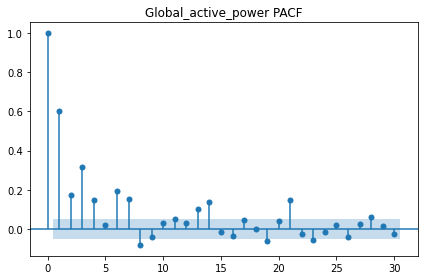

<Figure size 1296x504 with 0 Axes>

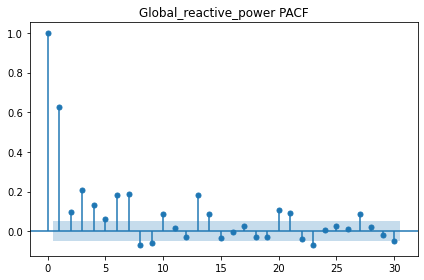

<Figure size 1296x504 with 0 Axes>

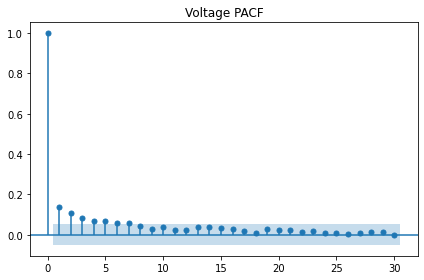

<Figure size 1296x504 with 0 Axes>

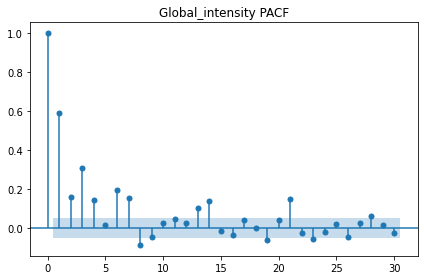

<Figure size 1296x504 with 0 Axes>

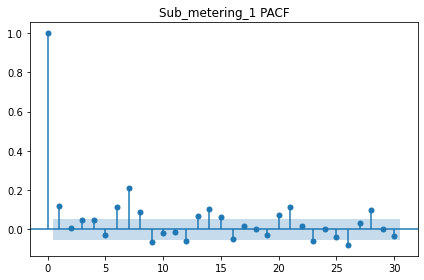

<Figure size 1296x504 with 0 Axes>

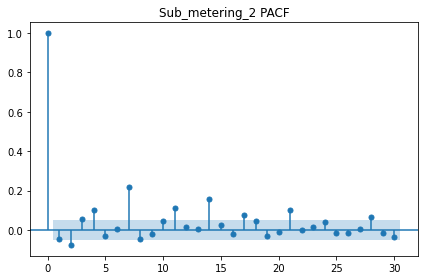

<Figure size 1296x504 with 0 Axes>

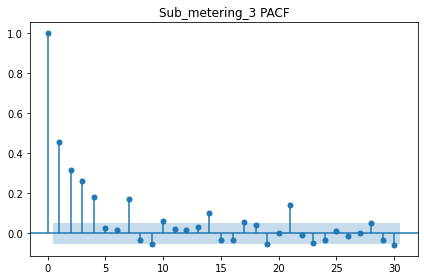

In [54]:
for col in data.columns:
    p_pacf(data[col],col,max_lag = 30)

### Target  ACF

In [379]:
y_mat

array([1686.404     , 2847.688     , 1821.462     , 1480.44      ,
       3133.732     , 3407.262     , 2180.494     , 1777.64      ,
       2987.854     , 1596.344     , 1617.972     , 2044.072     ,
       3091.29561504, 1982.664     , 1707.798     , 2363.752     ,
       1824.76      , 1667.736     , 4029.722     , 3595.94      ,
       1645.28      , 1273.48      , 2328.018     , 1801.414     ,
       1620.198     , 2829.328     , 3571.228     , 1877.61      ,
       1414.546     , 2498.672     , 1985.346     , 1702.528     ,
       2076.912     , 3829.762     , 2186.614     , 3149.928     ,
       2072.874     , 3371.66123007, 1313.48      ,  714.922     ,
        501.74      ,  568.484     ,  518.112     ,  520.774     ,
        517.564     ,  515.688     ,  819.122     , 2090.7       ,
       2660.332     , 1246.5       , 2375.206     , 1572.132     ,
       1272.612     , 2484.712     , 3480.636     , 1950.668     ,
       1290.144     , 1793.364     , 1884.814     , 1702.054  

(0.0, 50.0)

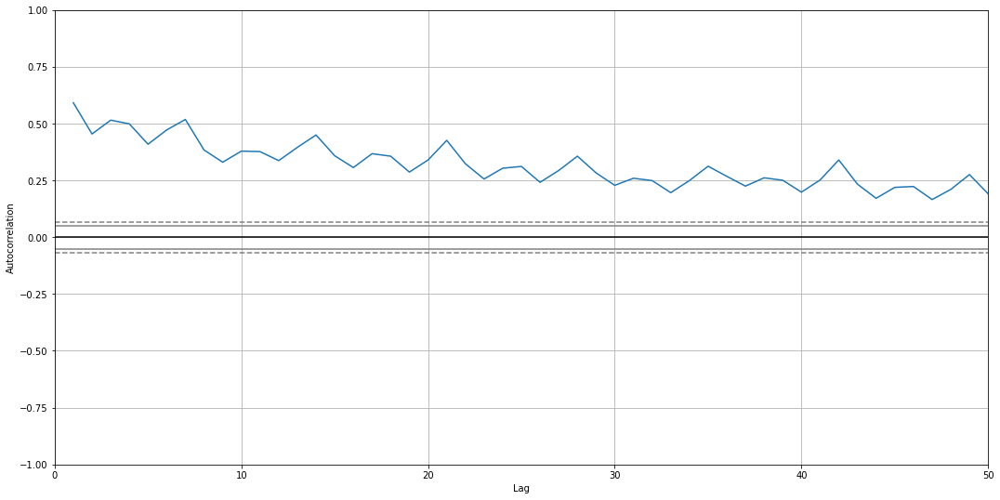

In [68]:
plt.figure(figsize = (18,9))
# plt.title(Y.name)
autocorrelation_plot(Y.tolist()).set_xlim([0, 50])

Two Ways to Explain the PACF lag

1.choose only one lag of one feature

2.choose lags from 0 to the computed lag based on AIC,BIC,HQIC : So this is like a lag subset of one feature 

## Other Metrics

In [71]:
def Forest_Regressor(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    #RandomForestRegressor
    reg_rfr = RandomForestRegressor()
    reg_rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = reg_rfr.predict(x_test)
    y_rfr_inverse = minmax_y_test.inverse_transform(y_rfr.reshape((-1,1))).reshape(-1,)

    return sqrt(mean_squared_error(y_rfr_inverse, y_test_inverse ))

In [41]:
def Linear_Regressor(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
 

    return sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse))

In [165]:
def Stacking_Regressor(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    #Split Data
#     X_train,X_test,Y_train,Y_test = split_data(x_scaled,y_scaled,percent)
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    #LInear Regression
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    elastic = ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, .995, 1], eps=0.001, n_alphas=100, fit_intercept=True, 
                        normalize=True, precompute='auto', max_iter=2000, tol=0.0001, cv=5, 
                        copy_X=True, verbose=0, n_jobs=-1, positive=False, random_state=None, selection='cyclic')
    
    elastic.fit(x_train,y_train.reshape(-1,))
    y_elastic = elastic.predict(x_test)
    y_elastic_inverse =minmax_y_test.inverse_transform(y_elastic.reshape((-1,1)))
    
    #RandomForestRegressor
    reg_rfr = RandomForestRegressor()
    reg_rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = reg_rfr.predict(x_test)
    y_rfr_inverse = minmax_y_test.inverse_transform(y_rfr.reshape((-1,1))).reshape(-1,)

    
    fig,ax = plt.subplots(3,1,figsize=(20,12))
    ax[0].plot(y_Linear_a_inverse,label='Linear')
    ax[0].plot(y_test_inverse ,label='Actual')
    ax[0].legend()
    ax[1].plot(y_rfr_inverse,label='RandomForestRegressor')
    ax[1].plot(y_test_inverse ,label='Actual')
    ax[1].legend()
    ax[2].plot(y_elastic_inverse,label='ElasticNet')
    ax[2].plot(y_test_inverse ,label='Actual')
    ax[2].legend()
    
    print("Linear_r2:%f"%(r2_score(y_Linear_a_inverse, y_test_inverse  ))+"\n",
      "Linear_rmse:%f"%(sqrt(mean_squared_error(y_Linear_a_inverse, y_test_inverse )))+"\n",
      "Linear_mse:%f"%(mean_squared_error(y_Linear_a_inverse, y_test_inverse  ))+"\n",
          "RandomForestRegressor_r2:%f"%(r2_score(y_rfr_inverse, y_test_inverse  ))+"\n",
          "RandomForestRegressor_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, y_test_inverse  )))+"\n",
          "RandomForestRegressor_mse:%f"%(mean_squared_error( y_rfr_inverse, y_test_inverse  )),
        "elastic_r2:%f"%(r2_score(y_elastic_inverse, y_test_inverse  ))+"\n",
          "elastic_rmse:%f"%(sqrt(mean_squared_error(y_elastic_inverse, y_test_inverse  )))+"\n",
          "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, y_test_inverse  )),     
     )
    
    y_df = {
        "Original": y_test_inverse,
        "Linear":y_Linear_a_inverse,
        "RandomForestRegressor":y_rfr_inverse,
        'Elastic':y_elastic_inverse
    }
    
    RMSE_dict = {
        "Linear":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "RandomForestRegressor":sqrt(mean_squared_error(y_rfr_inverse, y_test_inverse )),
        'Elastic':sqrt(mean_squared_error(y_elastic_inverse, y_test_inverse ))
    }
    
    return y_df,RMSE_dict

In [868]:
def split_df(feature_cols,max_lag,data):
    # Store each feature's dataframe:
    df_all = {}
    for col in feature_cols:
        feature_df = pd.DataFrame(data[col])
        for i in range(1,max_lag+1):
            feature_df = pd.concat([feature_df,data[col+"_lag_"+str(i)]],axis=1)         
        df_all[col] = feature_df
    return df_all

In [125]:
def my_mi(X,y):
    x = X.reshape(-1,1)
    MI = mutual_info_regression(x,y)
    return MI

def my_mic(X,y):
    mine = MINE()
    mine.compute_score(X.flatten(),y.flatten())
    real_mic = mine.mic()
    return real_mic

def my_cca(X, y):
    x = X.copy()
    if len(x.shape) == 1:
        x = x.reshape(-1, 1)
    cca = CCA().test(x,y)[0]
    return cca

def my_hsic(X, y):
    x = X.copy()
    if len(X.shape) == 1:
        x = x.reshape(-1, 1)
    hsic = Hsic().test(x,y)[0]
    return hsic

def mRMR(X,selected, y,idx,metric):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric(X[:,idx],y)
        
    else:
        x = X[:,selected].copy()
        col_len = x.shape[1]
        relevance_score = 0
        redundency_score = 0

        relevance_score = metric(X[:,idx],y)
        
        for i in range(col_len):
            redundency_score +=  metric(x[:,i], X[:,idx])
        redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr


def feature_selection(x, y, metric,feature_num=30):
    X = np.array(x)
    Y = np.array(y)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))

    # stop = False
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0
        for idx in rest:

            if metric == 'CCA':
                temp_score = mRMR(X,selected, Y,idx, my_cca)
                
            elif (metric == 'MIC'):
                temp_score =   mRMR(X,selected, Y,idx,my_mic)

            elif (metric =='MI'):
                temp_score =   mRMR(X,selected, Y,idx,my_mi)
                
            elif (metric == 'Pearson'):
                temp_score =   mRMR(X,selected, Y,idx,pearson)
                
            elif (metric =='RDC'):
                temp_score =   mRMR(X,selected, Y,idx,rdc_metric)
                
            elif(metric =='Hsic'):
                temp_score =   mRMR(X,selected, Y,idx,my_hsic)   
           
            if (temp_score > max_score):
                id_max = idx
                max_score = temp_score 

        if max_score <= 0 or len(selected)==feature_num:        
             return selected
             break

        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score},numbers:{len(selected)}/{feature_num}",end = "\r",flush=True)
    return selected